In [1]:
import requests
import urllib.request
import time
from bs4 import BeautifulSoup
from fish_helpers import *

In [4]:

url = 'https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?view=data&acc=GSM303489&id=26467&db=GeoDb_blob26'
response = requests.get(url)
soup = BeautifulSoup(response.text,"html.parser")
IDs = []
Values = []
for i,line in enumerate(soup.text.split('\n')):
    if '\t' in line:
        ID,Value = line.split('\t')
        IDs.append(ID)
        Values.append(Value)
df = pd.DataFrame(data=Values[1:],index=IDs[1:],columns=['Value'])
df

,Value
1415670_AT,8.406554
1415671_AT,11.616650
1415672_AT,11.201223
1415673_AT,6.279438
1415674_A_AT,9.775987
1415675_AT,8.676551
1415676_A_AT,10.775267
1415677_AT,10.195047
1415678_AT,11.102864
1415679_AT,12.077313


In [394]:
import pandas as pd
import numpy as np
from os import path
import gtfparse
import pyensembl
pyensembl.EnsemblRelease(release=87)
import gspread
from  oauth2client.service_account  import ServiceAccountCredentials
import gspread
import sys
if sys.version_info[0] < 3: 
    from StringIO import StringIO
else:
    from io import StringIO
    scope = ['https://spreadsheets.google.com/feeds',
        'https://www.googleapis.com/auth/drive']
# Path to .json
path = '/bigstore/GeneralStorage/Zach/MERFISH/Probe_Design/ProbeDesign-92ebdb6a17a7.json'
creds = ServiceAccountCredentials.from_json_keyfile_name(path, scope)
client = gspread.authorize(creds)
# Start with a gene list 
expression_worksheet = client.open("SelectedDatasets").sheet1
expression = expression_worksheet.get_all_records()
expression_df = pd.DataFrame(expression)
expression_df

[2019-11-07 14:12:03] INFO: Refreshing access_token


,,Cell subtypes,Cell types,Comments,GSE number,GSM number,URL,types
0,,T Cells CD8 Actived,Total CD8 T cell,,GSE62691,GSM1531520,https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi...,T cell
1,,T Cells CD8 Actived,Total CD8 T cell,,GSE62691,GSM1531521,https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi...,T cell
2,,T Cells CD8 Actived,Total CD8 T cell,,GSE62691,GSM1531522,https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi...,T cell
3,,T Cells CD8 Actived,Total CD8 T cell,,GSE62691,GSM1531523,https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi...,T cell
4,,T Cells CD8 Actived,Total CD8 T cell,,GSE62691,GSM1531524,https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi...,T cell
5,,T Cells CD8 Actived,Total CD8 T cell,,GSE62691,GSM1531525,https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi...,T cell
6,,T Cells CD8 Naive,Total CD8 T cell,,GSE62691,GSM1531517,https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi...,T cell
7,,T Cells CD8 Naive,Total CD8 T cell,,GSE62691,GSM1531519,https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi...,T cell
8,,T Cells CD8 Naive,Total CD8 T cell,,GSE62691,GSM1531518,https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi...,T cell
9,,T Cells CD8 Memory,Total CD8 T cell,,GSE62691,GSM1531516,https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi...,T cell


In [ ]:
response = requests.get(expression_df['URL'][0])
soup = BeautifulSoup(response.text,"html.parser")
soup.text.split('\n')

In [ ]:
expression_df['GSM number'][idx]

In [36]:
GSM_dict = {}
GSM_info_dict = {}
for idx,url in enumerate(expression_df['URL']):
    gsm = expression_df['GSM number'][idx]
    response = requests.get(url)
    soup = BeautifulSoup(response.text,"html.parser")
    soup.text.split('\n')
    df_dict = {}
    info_dict = {}
    Value_i = None
    for i,line in enumerate(soup.text.split('\n')):
        if '#' in line:
            line = line.split('#')[1]
            info_dict[line.split(' = ')[0]]=line.split('=')[1]
        if '\t' in line:
            for n,cell in enumerate(line.split('\t')):
                if not str(n) in df_dict.keys():
                    df_dict[str(n)] = []
                df_dict[str(n)].append(cell)
    df = pd.DataFrame()
    for name,column in df_dict.items():
        if 'VALUE'==column[0]:
            column[1:] = list(map(float,column[1:]))
        df[column[0]] = column[1:]
    df.index = df['ID_REF']
    df = df.drop(columns='ID_REF')
    info_df = pd.DataFrame()
    info_list = []
    index_list = []
    for index,value in info_dict.items():
        info_list.append(value)
        index_list.append(index)
    info_df = pd.DataFrame(data=info_list,index=index_list,columns=[gsm])
    GSM_dict[gsm] = df
    GSM_info_dict[gsm] = info_df
    print(info_df)
    print(df.head(5))

                                                          GSM1531520
ID_REF                                                              
VALUE                                                    GCOS Signal
ABS_CALL            indicating whether the transcript was present...
DETECTION P-VALUE                                                   
                   VALUE ABS_CALL DETECTION P-VALUE
ID_REF                                             
AFFX-BioB-5_at   55.7887        P       0.000340305
AFFX-BioB-M_at   82.7842        P       4.42873e-05
AFFX-BioB-3_at   54.6044        P       4.42873e-05
AFFX-BioC-5_at  191.9350        P       5.16732e-05
AFFX-BioC-3_at  291.9130        P       4.42873e-05
                                                          GSM1531521
ID_REF                                                              
VALUE                                                    GCOS Signal
ABS_CALL            indicating whether the transcript was present...
DETECTION P-VAL

                                                          GSM1531513
ID_REF                                                              
VALUE                                                    GCOS Signal
ABS_CALL            indicating whether the transcript was present...
DETECTION P-VALUE                                                   
                  VALUE ABS_CALL DETECTION P-VALUE
ID_REF                                            
AFFX-BioB-5_at  102.185        P       6.02111e-05
AFFX-BioB-M_at  193.433        P       4.42873e-05
AFFX-BioB-3_at  108.283        P       4.42873e-05
AFFX-BioC-5_at  263.565        P       5.16732e-05
AFFX-BioC-3_at  396.548        P       4.42873e-05
                                                          GSM1531514
ID_REF                                                              
VALUE                                                    GCOS Signal
ABS_CALL            indicating whether the transcript was present...
DETECTION P-VALUE     

                                  GSM357841
ID_REF                                     
VALUE               MAS5.0 signal intensity
ABS_CALL                             A or P
DETECTION P-VALUE                          
                  VALUE ABS_CALL DETECTION P-VALUE
ID_REF                                            
AFFX-BioB-5_at  1603.08        P       6.02111e-05
AFFX-BioB-M_at  2604.51        P       4.42873e-05
AFFX-BioB-3_at  1792.12        P       4.42873e-05
AFFX-BioC-5_at  4921.82        P       4.42873e-05
AFFX-BioC-3_at  6720.68        P       4.42873e-05
                                      GSM188001
ID_REF                                         
VALUE                              Signal Value
ABS_CALL            Absence or Presence of Gene
DETECTION P-VALUE                              
                VALUE ABS_CALL DETECTION P-VALUE
ID_REF                                          
1415670_at     4608.6        P           0.01416
1415671_at     3847.5        P      

                                                           GSM709397
ID_REF                                                              
VALUE                                                         Signal
ABS_CALL            indicating whether the transcript was present...
DETECTION P-VALUE                                                   
                   VALUE ABS_CALL DETECTION P-VALUE
ID_REF                                             
AFFX-BioB-5_at   405.305        P         0.0012475
AFFX-BioB-M_at   591.804        P        0.00010954
AFFX-BioB-3_at   388.217        P       7.00668e-05
AFFX-BioC-5_at  1172.750        P        0.00010954
AFFX-BioC-3_at  1538.870        P       4.42873e-05
                                                           GSM709398
ID_REF                                                              
VALUE                                                         Signal
ABS_CALL            indicating whether the transcript was present...
DETECTION P-VAL

                                               GSM1289343
ID_REF                                                   
VALUE    RMA background corrected log 2 transformed va...
                 VALUE
ID_REF                
1415670_at     8.62239
1415671_at    11.37650
1415672_at    11.28260
1415673_at     6.87241
1415674_a_at   9.85818
               GSM1537848
ID_REF                   
VALUE    Signal Intensity
                  VALUE
ID_REF                 
1415671_at    11.861800
1415672_at    10.735754
1415673_at     7.106147
1415674_a_at   9.355718
1415675_at     8.368053
               GSM1537849
ID_REF                   
VALUE    Signal Intensity
                  VALUE
ID_REF                 
1415671_at    12.025887
1415672_at    10.768197
1415673_at     6.665871
1415674_a_at   9.336052
1415675_at     8.285684
               GSM1537850
ID_REF                   
VALUE    Signal Intensity
                  VALUE
ID_REF                 
1415671_at    12.025887
1415672_at    10.768197

                        GSM94744
ID_REF                          
VALUE    RMA normalized unlogged
                    VALUE
ID_REF                   
1415670_at     774.820427
1415671_at     603.568164
1415672_at    1008.634134
1415673_at      75.510241
1415674_a_at   211.318626
                        GSM94745
ID_REF                          
VALUE    RMA normalized unlogged
                    VALUE
ID_REF                   
1415670_at     680.043576
1415671_at     486.531737
1415672_at    1063.012377
1415673_at      35.209054
1415674_a_at   141.181377
                        GSM94747
ID_REF                          
VALUE    RMA normalized unlogged
                    VALUE
ID_REF                   
1415670_at    1917.597516
1415671_at     562.703046
1415672_at    1397.783378
1415673_at     126.370603
1415674_a_at   148.946497
                        GSM94762
ID_REF                          
VALUE    RMA normalized unlogged
                    VALUE
ID_REF                   
141567

In [124]:
# convert ID_REF to Ensemble ID or gname
GSM_dict.keys()
a = 'GSM1531520'
b = 'GSM459841'
gsm_a = GSM_dict[a]
gsm_b = GSM_dict[b]
X = []
Y = []
I = []
for idx in gsm_a.index:
    if idx in gsm_b.index:
        x = gsm_a['VALUE'].loc[idx]
        y = gsm_b['VALUE'].loc[idx]
        if (x>1) and (y>1):
            I.append(idx)
            X.append(x)
            Y.append(y)


In [205]:
info_Matrix = pd.DataFrame(index = ['ID_REF', 'VALUE', 'ABS_CALL', 'DETECTION P-VALUE'])
for key,df in GSM_info_dict.items():
    info_Matrix[key] = df

In [206]:
info_Matrix

,GSM1531520,GSM1531521,GSM1531522,GSM1531523,GSM1531524,GSM1531525,GSM1531517,GSM1531519,GSM1531518,GSM1531516,...,GSM94744,GSM94745,GSM94747,GSM94762,GSM94763,GSM94764,GSM703047,GSM703048,GSM703049,GSM703050
ID_REF,,,,,,,,,,,...,,,,,,,,,,
VALUE,GCOS Signal,GCOS Signal,GCOS Signal,GCOS Signal,GCOS Signal,GCOS Signal,GCOS Signal,GCOS Signal,GCOS Signal,GCOS Signal,...,RMA normalized unlogged,RMA normalized unlogged,RMA normalized unlogged,RMA normalized unlogged,RMA normalized unlogged,RMA normalized unlogged,MAS5.0 signal intensity,MAS5.0 signal intensity,MAS5.0 signal intensity,MAS5.0 signal intensity
ABS_CALL,indicating whether the transcript was present...,indicating whether the transcript was present...,indicating whether the transcript was present...,indicating whether the transcript was present...,indicating whether the transcript was present...,indicating whether the transcript was present...,indicating whether the transcript was present...,indicating whether the transcript was present...,indicating whether the transcript was present...,indicating whether the transcript was present...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DETECTION P-VALUE,,,,,,,,,,,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [172]:
Matrix = pd.DataFrame()
for key,df in GSM_dict.items():
    Matrix[key] = df['VALUE']

In [207]:
pickle.dump(info_Matrix,open('/home/zach/PythonRepos/PyScripts/MERCI/info_Matrix.pkl','wb'))
pickle.dump(Matrix,open('/home/zach/PythonRepos/PyScripts/MERCI/Raw_Matrix.pkl','wb'))

In [444]:
info_Matrix = pickle.load(open('/home/zach/PythonRepos/PyScripts/MERCI/info_Matrix.pkl','rb'))
Matrix = pickle.load(open('/home/zach/PythonRepos/PyScripts/MERCI/Raw_Matrix.pkl','rb'))

In [3]:
Matrix


,GSM1531520,GSM1531521,GSM1531522,GSM1531523,GSM1531524,GSM1531525,GSM1531517,GSM1531519,GSM1531518,GSM1531516,...,GSM94744,GSM94745,GSM94747,GSM94762,GSM94763,GSM94764,GSM703047,GSM703048,GSM703049,GSM703050
ID_REF,,,,,,,,,,,,,,,,,,,,,
AFFX-BioB-5_at,55.788700,68.415200,19.777100,88.736500,88.235100,26.507000,105.155000,33.200600,212.072000,105.846000,...,724.964872,444.628484,135.516688,106.205771,96.155576,277.364328,344.513890,365.854087,366.186351,450.811713
AFFX-BioB-M_at,82.784200,140.909000,38.693300,134.609000,132.065000,37.184800,172.950000,61.011200,396.250000,177.951000,...,1236.444082,749.470659,222.566920,188.454074,169.505409,419.792856,487.934832,569.522913,517.405325,806.646890
AFFX-BioB-3_at,54.604400,73.800000,23.068900,74.282800,87.634700,24.571700,96.867000,27.269000,243.898000,107.223000,...,1186.959653,700.711685,143.242018,153.771002,139.094688,393.810640,232.898131,415.263390,306.455019,480.443145
AFFX-BioC-5_at,191.935000,263.471000,205.358000,284.332000,245.934000,228.015000,330.866000,355.844000,684.941000,261.475000,...,1988.763475,1246.884606,401.660523,342.272253,292.462897,767.749467,1038.674569,1335.752502,1357.546305,1585.393533
AFFX-BioC-3_at,291.913000,396.553000,286.583000,377.967000,412.047000,339.558000,568.290000,514.984000,980.317000,363.670000,...,1466.046085,999.760995,364.893231,255.262559,254.270827,631.637662,1164.661989,1356.680051,1587.369761,1847.068027
AFFX-BioDn-5_at,409.002000,602.038000,701.740000,641.067000,582.451000,766.423000,781.638000,1103.650000,1554.200000,750.125000,...,3403.542666,2337.139203,774.518668,557.799986,591.346388,1234.361650,2010.063059,3325.338367,2304.545204,3789.350753
AFFX-BioDn-3_at,602.962000,839.012000,958.616000,857.434000,800.779000,1036.310000,1032.980000,1512.360000,1989.870000,1117.040000,...,6045.148774,4322.737993,1645.906104,1055.421037,1197.143516,2681.821016,5023.179141,6585.502635,6420.376186,7519.745734
AFFX-CreX-5_at,2808.980000,3711.500000,3383.400000,4131.810000,3667.490000,3582.650000,4789.450000,5172.160000,8356.660000,3569.530000,...,12824.525970,11578.024870,5130.554847,3415.801444,4153.370681,6337.574165,11745.712450,19470.464250,14480.287360,22317.954310
AFFX-CreX-3_at,2984.520000,4034.920000,3503.720000,4104.950000,3909.900000,3701.800000,4374.710000,5534.440000,8576.560000,3675.280000,...,12218.116070,10809.360180,5179.436348,3285.486116,3920.293274,6180.762396,14598.404320,22136.852560,18254.498950,23747.490510


In [208]:
from sklearn.preprocessing import normalize
Norm_Matrix = normalize(Matrix)

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [125]:
counts_df = pd.DataFrame(index=I)
counts_df[a] = GSM_dict[a].loc[I]['VALUE']
counts_df[b] = GSM_dict[b].loc[I]['VALUE']

In [126]:
counts_df

,GSM1531520,GSM459841
AFFX-BioB-5_at,55.78870,334.0
AFFX-BioB-M_at,82.78420,496.0
AFFX-BioB-3_at,54.60440,422.0
AFFX-BioC-5_at,191.93500,777.0
AFFX-BioC-3_at,291.91300,1034.0
AFFX-BioDn-5_at,409.00200,1866.0
AFFX-BioDn-3_at,602.96200,4656.0
AFFX-CreX-5_at,2808.98000,10983.0
AFFX-CreX-3_at,2984.52000,13469.0
AFFX-DapX-5_at,69.87900,64.0


In [127]:
print(GSM_info_dict[a].loc['VALUE'])
print(GSM_info_dict[b].loc['VALUE'])


GSM1531520     GCOS Signal
Name: VALUE, dtype: object
GSM459841     RMA signal estimates from R
Name: VALUE, dtype: object


In [128]:
X2 = []
for x in X:
    X2.append(2**x)

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: overflow encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


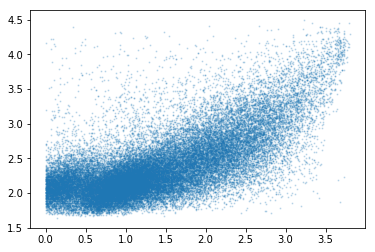

In [129]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
plt.scatter(np.log10(X),np.log10(Y),s=1,alpha=0.2)
plt.show()

In [131]:
import numpy as np
def size_factors(counts):
    counts = counts[np.alltrue(counts, axis=1)]
    logcounts = np.log(counts)
    loggeommeans = np.mean(logcounts, axis=1).reshape(len(logcounts), 1)
    sf = np.exp(np.median(logcounts - loggeommeans, axis=0)) 
    return sf
sf = size_factors(np.array(counts_df))
sf

array([0.31082205, 3.21727492])

In [132]:
from scipy.optimize import curve_fit

In [136]:
np.max(Y)

30883.0

In [140]:
def func(x,a,b,c):
    return a*np.exp(-b*x)+c
popt, pcov = curve_fit(func,X,Y)

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  
/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in multiply
  


In [197]:
len(X)

40738

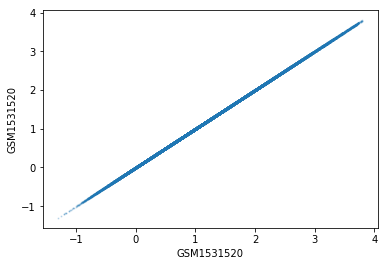

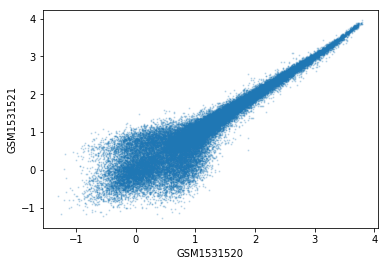

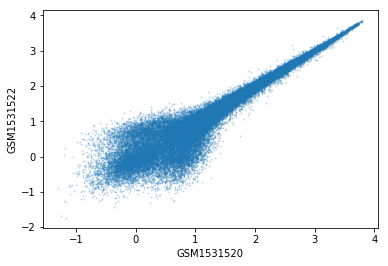

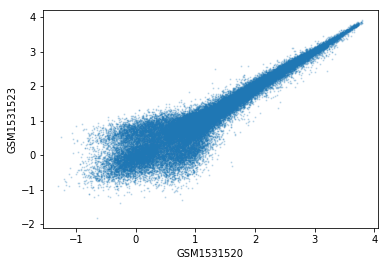

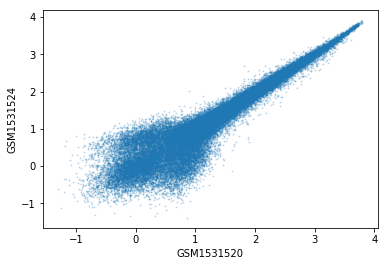

...

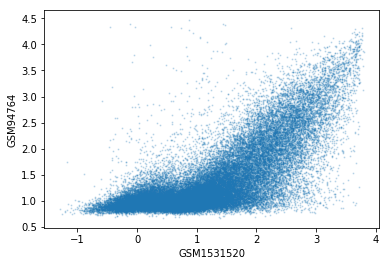

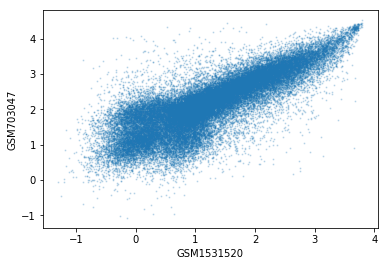

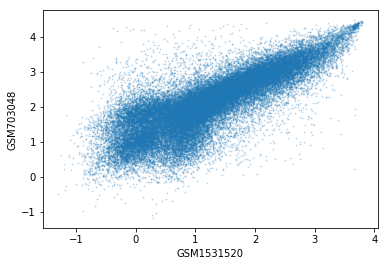

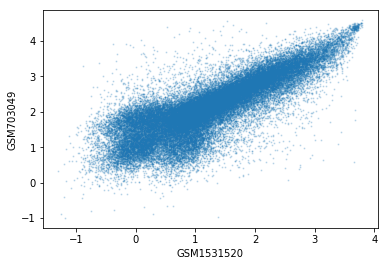

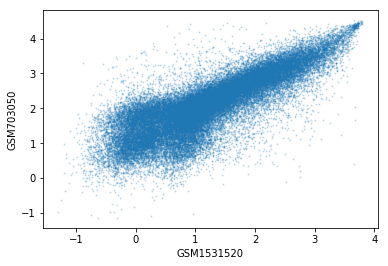

In [198]:
key1 = Matrix.columns[0]
x = np.array(Matrix[key1])
if np.min(x)<0:
    x=2**x
for key2 in Matrix.columns:
    y = np.array(Matrix[key2])
    if np.min(y)<0:
        y=2**y
    plt.scatter(np.log10(x),np.log10(y),s=1,alpha=0.2)
    plt.xlabel(key1)
    plt.ylabel(key2)
    plt.show()

In [177]:
np.array(Matrix[key1])

array([55.7887 , 82.7842 , 54.6044 , ..., 23.5228 ,  2.30467, 27.6368 ])

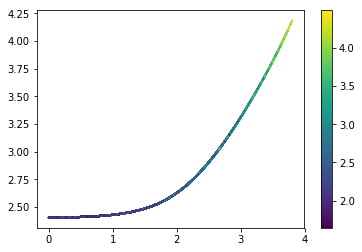

In [148]:
plt.scatter(np.log10(X),np.log10(func(np.array(X),*popt)),c=np.log10(Y),s=1)
plt.colorbar()
plt.show()

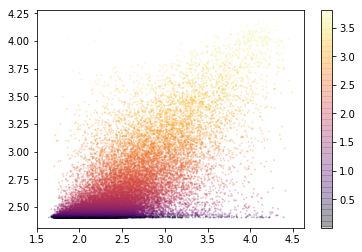

In [145]:
plt.scatter(np.log10(Y),np.log10(func(np.array(X),*popt)),c=np.log10(X),s=1,alpha=0.2,cmap='inferno')
plt.colorbar()
plt.show()

In [156]:
popt

array([ 1.76241486e+04, -9.76526972e-05, -1.73719629e+04])

In [88]:
new_X = func(np.array(X),*popt)

In [151]:
print(np.mean(X))
print(np.mean(new_X))
print(np.mean(Y))

171.47825341867545
573.9636635050917
573.9636702832736


In [152]:
print(np.median(X))
print(np.median(new_X))
print(np.median(Y))

16.926450000000003
281.34099920431254
179.0


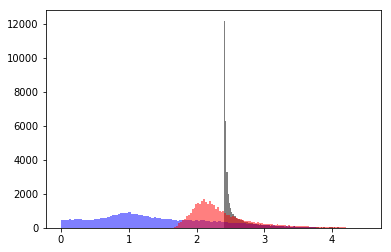

In [143]:
plt.hist(np.log10(new_X),bins=100,alpha=0.5,color='k')
plt.hist(np.log10(X),bins=100,alpha=0.5,color='b')
plt.hist(np.log10(Y),bins=100,alpha=0.5,color='r')
plt.show()

In [90]:
print(np.std(new_X))
print(np.std(Y))

1034.4339130414187
1575.7673350148054


In [157]:
from sklearn import preprocessing

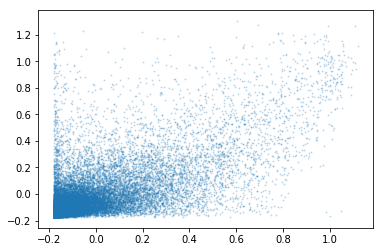

In [162]:
standardized_X = preprocessing.scale(X)
standardized_Y = preprocessing.scale(Y)
plt.scatter(np.log10(standardized_X+1),np.log10(standardized_Y+1),s=1,alpha=0.2)
plt.show()

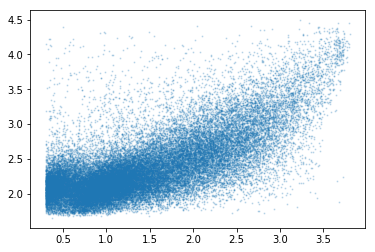

In [169]:
plt.scatter(np.log10(np.array(X)+1),np.log10(np.array(Y)+1),s=1,alpha=0.2)
plt.show()

In [166]:
from scipy.stats import spearmanr
from scipy.stats import spearmanr,pearsonr
print(spearmanr(standardized_X,standardized_Y))
print(pearsonr(standardized_X,standardized_Y))

SpearmanrResult(correlation=0.6432022660795794, pvalue=0.0)
(0.6543754403645541, 0.0)


In [167]:
print(spearmanr(X,Y))
print(pearsonr(X,Y))

SpearmanrResult(correlation=0.6432022660795794, pvalue=0.0)
(0.6543754403645542, 0.0)


In [102]:
GSE = 'GSE62691'
import GEOparse

In [103]:
gse_f = GEOparse.get_GEO_file(GSE)

29-Oct-2019 17:46:10 INFO GEOparse - No destination directory specified. Temporary files will be downloaded at /tmp/tmp99iz45cf
INFO:GEOparse:No destination directory specified. Temporary files will be downloaded at /tmp/tmp99iz45cf
29-Oct-2019 17:46:10 INFO GEOparse - Downloading ftp://ftp.ncbi.nlm.nih.gov/geo/series/GSE62nnn/GSE62691/soft/GSE62691_family.soft.gz to /tmp/tmp99iz45cf/GSE62691_family.soft.gz
INFO:GEOparse:Downloading ftp://ftp.ncbi.nlm.nih.gov/geo/series/GSE62nnn/GSE62691/soft/GSE62691_family.soft.gz to /tmp/tmp99iz45cf/GSE62691_family.soft.gz
100%|██████████| 15.3M/15.3M [00:01<00:00, 10.8MB/s]
29-Oct-2019 17:46:13 DEBUG downloader - Size validation passed
DEBUG:GEOparse:Size validation passed
29-Oct-2019 17:46:13 DEBUG downloader - Moving /tmp/tmp555q0wzo to /tmp/tmp99iz45cf/GSE62691_family.soft.gz
DEBUG:GEOparse:Moving /tmp/tmp555q0wzo to /tmp/tmp99iz45cf/GSE62691_family.soft.gz
29-Oct-2019 17:46:13 DEBUG downloader - Successfully downloaded ftp://ftp.ncbi.nlm.nih.go

In [104]:
gse = GEOparse.get_GEO(filepath=gse_f[0])

29-Oct-2019 17:46:13 INFO GEOparse - Parsing /tmp/tmp99iz45cf/GSE62691_family.soft.gz: 
INFO:GEOparse:Parsing /tmp/tmp99iz45cf/GSE62691_family.soft.gz: 
29-Oct-2019 17:46:13 DEBUG GEOparse - DATABASE: GeoMiame
DEBUG:GEOparse:DATABASE: GeoMiame
29-Oct-2019 17:46:13 DEBUG GEOparse - SERIES: GSE62691
DEBUG:GEOparse:SERIES: GSE62691
29-Oct-2019 17:46:13 DEBUG GEOparse - PLATFORM: GPL1261
DEBUG:GEOparse:PLATFORM: GPL1261
/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/GEOparse/GEOparse.py:88: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  return parse_GSE(filepath)
29-Oct-2019 17:46:15 DEBUG GEOparse - SAMPLE: GSM1531511
DEBUG:GEOparse:SAMPLE: GSM1531511
29-Oct-2019 17:46:16 DEBUG GEOparse - SAMPLE: GSM1531512
DEBUG:GEOparse:SAMPLE: GSM1531512
29-Oct-2019 17:46:16 DEBUG GEOparse - SAMPLE: GSM1531513
DEBUG:GEOparse:SAMPLE: GSM1531513
29-Oct-2019 17:46:16 DEBUG GEOparse - SAMPLE: GSM1531514
DEBUG:GEOparse:SAMPLE: GSM1531514

In [105]:
gse.gsms

{'GSM1531511': <SAMPLE: GSM1531511>,
 'GSM1531512': <SAMPLE: GSM1531512>,
 'GSM1531513': <SAMPLE: GSM1531513>,
 'GSM1531514': <SAMPLE: GSM1531514>,
 'GSM1531515': <SAMPLE: GSM1531515>,
 'GSM1531516': <SAMPLE: GSM1531516>,
 'GSM1531517': <SAMPLE: GSM1531517>,
 'GSM1531518': <SAMPLE: GSM1531518>,
 'GSM1531519': <SAMPLE: GSM1531519>,
 'GSM1531520': <SAMPLE: GSM1531520>,
 'GSM1531521': <SAMPLE: GSM1531521>,
 'GSM1531522': <SAMPLE: GSM1531522>,
 'GSM1531523': <SAMPLE: GSM1531523>,
 'GSM1531524': <SAMPLE: GSM1531524>,
 'GSM1531525': <SAMPLE: GSM1531525>}

In [106]:
gse.gsms['GSM1531511'].columns

,description
ID_REF,
VALUE,GCOS Signal
ABS_CALL,indicating whether the transcript was present ...
DETECTION P-VALUE,


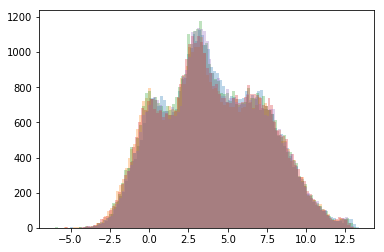

In [116]:
df = gse.pivot_samples('VALUE')
for column in df.columns[0:5]:
    plt.hist(np.log2(df[column]),bins=100,alpha=0.3)
plt.show()

In [27]:
from Bio.Affy import CelFile

In [242]:
!cd /home/zach/PythonRepos/PyScripts/MERCI/
!for f in GSM*; do cd ./$f;for r in *.CEL.gz; do gunzip $r; cd /home/zach/PythonRepos/PyScripts/MERCI/; done; done


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [13]:
base_path = '/home/zach/PythonRepos/PyScripts/MERCI/'
files = []
for r,d,f in os.walk(base_path):
    for file in f:
        if 'CEL.gz' in file:
            files.append(os.path.join(r,file))
files

['/home/zach/PythonRepos/PyScripts/MERCI/GSM357845/GSM357845.CEL.gz',
 '/home/zach/PythonRepos/PyScripts/MERCI/GSM1289343/GSM1289343_mouse_M2_3.CEL.gz',
 '/home/zach/PythonRepos/PyScripts/MERCI/GSM432169/GSM432169.CEL.gz',
 '/home/zach/PythonRepos/PyScripts/MERCI/GSM1537858/GSM1537858_MA85_Dusp5_WT_IL-33_4hrs_Mouse430v2.CEL.gz',
 '/home/zach/PythonRepos/PyScripts/MERCI/GSM94744/GSM94744.CEL.gz',
 '/home/zach/PythonRepos/PyScripts/MERCI/GSM357850/GSM357850.CEL.gz',
 '/home/zach/PythonRepos/PyScripts/MERCI/GSM357843/GSM357843.CEL.gz',
 '/home/zach/PythonRepos/PyScripts/MERCI/GSM1289335/GSM1289335_mouse_M0_1.CEL.gz',
 '/home/zach/PythonRepos/PyScripts/MERCI/GSM459836/GSM459836.CEL.gz',
 '/home/zach/PythonRepos/PyScripts/MERCI/GSM459844/GSM459844.CEL.gz',
 '/home/zach/PythonRepos/PyScripts/MERCI/GSM1531518/GSM1531518_Grp3_Chip2_CD44negCD127pos_spl_exvivo.CEL.gz',
 '/home/zach/PythonRepos/PyScripts/MERCI/GSM188002/GSM188002.CEL.gz',
 '/home/zach/PythonRepos/PyScripts/MERCI/GSM1531524/GSM153

In [255]:
with open(files[0],'rb') as handle:
    c= CelFile.read_v3(handle)

In [4]:
from pyaffy import rma

In [42]:
from collections import OrderedDict
sample_cel_files = OrderedDict()
for i,file in enumerate(files):
    if i>1:
        continue
    key = file.split('/')[-2]#.split('.CEL')[0].split('_')[0]
    #sample_cel_files[key] = CelFile.read_v3(open(file,'rb'))
    sample_cel_files[key] = file

In [43]:
sample_cel_files

OrderedDict([('GSM357845',
              '/home/zach/PythonRepos/PyScripts/MERCI/GSM357845/GSM357845.CEL.gz'),
             ('GSM1289343',
              '/home/zach/PythonRepos/PyScripts/MERCI/GSM1289343/GSM1289343_mouse_M2_3.CEL.gz')])

In [44]:
cdf_file = '/home/zach/PythonRepos/PyScripts/MERCI/CD_Mouse430A_2/Full/Mouse430A_2/LibFiles/Mouse430A_2.cdf'
genes, samples, X = rma(cdf_file, sample_cel_files)

[2019-10-31 17:45:15] INFO: Parsing CDF file.
[2019-10-31 17:45:17] INFO: CDF file parsing time: 1.27 s
[2019-10-31 17:45:17] INFO: CDF array design name: b'Mouse430A_2'
[2019-10-31 17:45:17] INFO: CDF rows / columns: 732 x 732
[2019-10-31 17:45:17] INFO: Parsing CEL files...


TypeError: a bytes-like object is required, not 'str'

In [46]:
samples[0]

'GSM357845'

In [48]:
from collections import OrderedDict
cdf_file = '/home/zach/PythonRepos/PyScripts/MERCI/CD_Mouse430A_2/Full/Mouse430A_2/LibFiles/Mouse430A_2.cdf'
gene_dict = {}
sample_dict = {}
X_dict = {}
CEL_Matrix = pd.DataFrame()
for i,file in enumerate(files):
    key = file.split('/')[-2]#.split('.CEL')[0].split('_')[0]
    sample_cel_files = OrderedDict([(key,file)])
    genes, samples, X = rma(cdf_file, sample_cel_files)
    gene_dict[samples[0]] = genes
    sample_dict[samples[0]] = samples
    X_dict[samples[0]] = X
    temp_df = pd.DataFrame(data=X,index=genes,columns=samples)
    CEL_Matrix[samples[0]] = temp_df

[2019-10-31 17:49:44] INFO: Parsing CDF file.
[2019-10-31 17:49:45] INFO: CDF file parsing time: 1.44 s
[2019-10-31 17:49:45] INFO: CDF array design name: b'Mouse430A_2'
[2019-10-31 17:49:45] INFO: CDF rows / columns: 732 x 732
[2019-10-31 17:49:45] INFO: Parsing CEL files...
[2019-10-31 17:49:45] INFO: CEL files parsing time: 0.2 s.
[2019-10-31 17:49:45] INFO: Performing background correction...
[2019-10-31 17:49:45] INFO: Background correction time: 0.1 s.
[2019-10-31 17:49:45] INFO: Performing quantile normalization...
[2019-10-31 17:49:45] INFO: Quantile normalization time: 0.1 s.
[2019-10-31 17:49:45] INFO: Summarize probeset intensities (with medianpolish)...
[2019-10-31 17:51:42] INFO: Probeset summarization time: 116.30 s.
[2019-10-31 17:51:42] INFO: Total RMA time: 118.1 s.


ValueError: Cannot set a frame with no defined index and a value that cannot be converted to a Series

In [ ]:
from collections import OrderedDict
cdf_file = '/home/zach/PythonRepos/PyScripts/MERCI/CD_Mouse430A_2/Full/Mouse430A_2/LibFiles/Mouse430A_2.cdf'
gene_dict = {}
sample_dict = {}
X_dict = {}
df_dict = {}
bad_keys = []
for i,file in enumerate(files):
    try:
        key = file.split('/')[-2]#.split('.CEL')[0].split('_')[0]
        print(key)
        sample_cel_files = OrderedDict([(key,file)])
        genes, samples, X = rma(cdf_file, sample_cel_files)
        gene_dict[samples[0]] = genes
        sample_dict[samples[0]] = samples
        X_dict[samples[0]] = X
        temp_df = pd.DataFrame(data=X,index=genes,columns=samples)
        df_dict[samples[0]] = temp_df
    except:
        bad_keys.append(key)
        print(key,'is fucked up')

GSM357845
[2019-10-31 17:55:16] INFO: Parsing CDF file.
[2019-10-31 17:55:17] INFO: CDF file parsing time: 1.14 s
[2019-10-31 17:55:17] INFO: CDF array design name: b'Mouse430A_2'
[2019-10-31 17:55:17] INFO: CDF rows / columns: 732 x 732
[2019-10-31 17:55:17] INFO: Parsing CEL files...
[2019-10-31 17:55:17] INFO: CEL files parsing time: 0.2 s.
[2019-10-31 17:55:17] INFO: Performing background correction...
[2019-10-31 17:55:17] INFO: Background correction time: 0.1 s.
[2019-10-31 17:55:17] INFO: Performing quantile normalization...
[2019-10-31 17:55:17] INFO: Quantile normalization time: 0.1 s.
[2019-10-31 17:55:17] INFO: Summarize probeset intensities (with medianpolish)...
[2019-10-31 17:57:13] INFO: Probeset summarization time: 116.24 s.
[2019-10-31 17:57:13] INFO: Total RMA time: 117.7 s.
GSM1289343
[2019-10-31 17:57:13] INFO: Parsing CDF file.
[2019-10-31 17:57:15] INFO: CDF file parsing time: 1.14 s
[2019-10-31 17:57:15] INFO: CDF array design name: b'Mouse430A_2'
[2019-10-31 17:

In [52]:
for bad_key in bad_keys:
    print('Bad:',bad_key)
    for f in files:
        if bad_key in f:
            print(f)

Bad: GSM1289343
/home/zach/PythonRepos/PyScripts/MERCI/GSM1289343/GSM1289343_mouse_M2_3.CEL.gz
Bad: GSM1537858
/home/zach/PythonRepos/PyScripts/MERCI/GSM1537858/GSM1537858_MA85_Dusp5_WT_IL-33_4hrs_Mouse430v2.CEL.gz
Bad: GSM1289335
/home/zach/PythonRepos/PyScripts/MERCI/GSM1289335/GSM1289335_mouse_M0_1.CEL.gz
/home/zach/PythonRepos/PyScripts/MERCI/GSM_Zipped/GSM1289335_mouse_M0_1.CEL.gz
Bad: GSM921677
/home/zach/PythonRepos/PyScripts/MERCI/GSM921677/GSM921677_mono_3.CEL.gz
Bad: GSM1537849
/home/zach/PythonRepos/PyScripts/MERCI/GSM1537849/GSM1537849_MA76_Dusp5_WT_Untreated_Mouse430v2.CEL.gz
Bad: GSM1537861
/home/zach/PythonRepos/PyScripts/MERCI/GSM1537861/GSM1537861_MA88_Dusp5_WT_IL-33_4hrs_Mouse430v2.CEL.gz
Bad: GSM1289340
/home/zach/PythonRepos/PyScripts/MERCI/GSM1289340/GSM1289340_mouse_M1_3.CEL.gz
Bad: GSM1537851
/home/zach/PythonRepos/PyScripts/MERCI/GSM1537851/GSM1537851_MA78_Dusp5_WT_Untreated_Mouse430v2.CEL.gz
Bad: GSM1289341
/home/zach/PythonRepos/PyScripts/MERCI/GSM1289341/GSM1

In [ ]:
for bad_key in bad_keys:
    print('Bad:',bad_key)
    for f in files:
        if bad_key in f:
            print(f)

In [56]:
len(CEL_df.columns)

85

In [55]:
CEL_df = pd.DataFrame(index=df_dict['GSM357845'].index)
for key,df in df_dict.items():
    CEL_df[key] = df
CEL_df

,GSM357845,GSM432169,GSM94744,GSM357850,GSM357843,GSM459836,GSM459844,GSM1531518,GSM188002,GSM1531524,...,GSM432172,GSM94764,GSM703050,GSM459849,GSM794242,GSM1531521,GSM1531523,GSM459845,GSM94771,GSM357839
b'1415670_at',4.699317,4.372178,3.235671,4.859036,3.599099,6.512481,6.439919,3.405170,3.849245,3.999411,...,4.095437,4.170768,4.511133,5.613846,4.319728,3.579358,4.499707,6.150764,4.183007,4.126178
b'1415671_at',4.654364,4.679109,3.648849,5.166069,5.168604,6.528198,6.225309,3.405170,4.004209,3.638805,...,5.167644,6.171007,5.205355,5.554104,4.749588,4.315437,4.006018,6.130314,3.905153,4.735965
b'1415672_at',3.677454,4.181952,2.753795,3.431663,3.681416,4.882846,4.303376,3.041706,3.736080,2.660329,...,4.393438,4.143229,4.642121,4.353456,4.579637,3.017377,3.067354,4.787543,4.240899,3.729861
b'1415673_at',6.006977,4.448922,3.648849,5.581448,5.445780,6.758837,7.106618,4.892332,4.767432,3.784698,...,4.733344,4.115873,5.868921,6.713506,4.949443,4.169690,4.231585,6.150764,4.724018,4.353264
b'1415674_a_at',7.250864,6.197224,4.480874,6.583201,7.004892,7.351346,7.207676,5.310950,5.450369,5.692522,...,6.418900,4.311095,6.117584,6.906243,5.830297,5.162714,5.305970,7.190319,4.631533,6.998261
b'1415675_at',5.736601,5.714223,4.013643,4.376016,6.237159,6.922390,5.995889,4.684230,4.043582,4.205422,...,5.580501,4.484592,5.346366,4.898931,5.125060,4.013046,4.006018,6.088525,5.093674,5.468531
b'1415676_a_at',4.377156,4.830629,3.588466,4.132969,4.728033,6.528198,5.926428,3.041706,4.324174,3.346354,...,5.897419,4.397218,6.329738,5.726717,5.611693,3.579358,4.158661,6.267724,4.097551,4.015025
b'1415677_at',5.789624,5.293374,3.293035,4.007104,5.509085,5.045006,5.995889,5.575819,4.767432,4.795811,...,5.461185,3.705227,4.976032,6.356605,5.669528,3.846064,4.499707,6.658926,4.013856,4.996543
b'1415678_at',4.743807,4.295726,3.468797,4.316580,4.511136,4.535664,4.404356,4.377456,3.887575,4.336199,...,4.469028,4.226387,4.334041,4.400856,4.388648,4.243931,4.980090,3.894239,3.905153,4.163639
b'1415679_at',5.118518,5.514835,3.123045,4.491753,5.445780,7.420349,6.567085,3.845236,4.283709,5.075695,...,5.580501,3.955786,6.117584,6.408477,5.551444,4.690877,5.192197,7.077351,3.878510,5.174060


In [67]:
for cell_type in expression_df['types'].unique():
    print(cell_type)
    good = []
    bad = []
    for GSM in expression_df[expression_df['types']==cell_type]['GSM number']:
        if GSM in bad_keys:
            bad.append(GSM)
        else:
            good.append(GSM)
    print('Good: ',len(good))
    print('Bad: ',len(bad))

T cell
Good:  30
Bad:  0
NK cell
Good:  6
Bad:  0
Neutrophil
Good:  3
Bad:  0
Monocyte
Good:  15
Bad:  3
Mast cell
Good:  4
Bad:  0
Macrophage
Good:  0
Bad:  9
Eosinophils
Good:  0
Bad:  10
Dendritic cell
Good:  16
Bad:  0
B cell
Good:  11
Bad:  0


In [69]:
key = bad_keys[0]
file = [i for i in files if key in i][0]
# try:
key = file.split('/')[-2]#.split('.CEL')[0].split('_')[0]
print(key)
sample_cel_files = OrderedDict([(key,file)])
genes, samples, X = rma(cdf_file, sample_cel_files)
gene_dict[samples[0]] = genes
sample_dict[samples[0]] = samples
X_dict[samples[0]] = X
temp_df = pd.DataFrame(data=X,index=genes,columns=samples)
df_dict[samples[0]] = temp_df
# except:
#     bad_keys.append(key)
#     print(key,'is fucked up')

GSM1289343
[2019-11-01 10:59:02] INFO: Parsing CDF file.
[2019-11-01 10:59:03] INFO: CDF file parsing time: 1.17 s
[2019-11-01 10:59:03] INFO: CDF array design name: b'Mouse430A_2'
[2019-11-01 10:59:03] INFO: CDF rows / columns: 732 x 732
[2019-11-01 10:59:03] INFO: Parsing CEL files...


TypeError: a bytes-like object is required, not 'str'

In [70]:
df_dict.keys()

dict_keys(['GSM357845', 'GSM432169', 'GSM94744', 'GSM357850', 'GSM357843', 'GSM459836', 'GSM459844', 'GSM1531518', 'GSM188002', 'GSM1531524', 'GSM703047', 'GSM1531516', 'GSM303489', 'GSM459841', 'GSM459838', 'GSM709397', 'GSM1531512', 'GSM516561', 'GSM794243', 'GSM357841', 'GSM459842', 'GSM393943', 'GSM188005', 'GSM432170', 'GSM516571', 'GSM1531514', 'GSM794239', 'GSM459835', 'GSM459848', 'GSM94768', 'GSM461107', 'GSM357849', 'GSM94747', 'GSM94769', 'GSM794238', 'GSM357852', 'GSM94741', 'GSM459847', 'GSM393944', 'GSM432173', 'GSM303490', 'GSM703049', 'GSM94745', 'GSM709399', 'GSM357853', 'GSM432168', 'GSM1531525', 'GSM1531517', 'GSM459843', 'GSM188004', 'GSM1531511', 'GSM459850', 'GSM94762', 'GSM459846', 'GSM516580', 'GSM794240', 'GSM459837', 'GSM94763', 'GSM709398', 'GSM703048', 'GSM188006', 'GSM432171', 'GSM1531515', 'GSM393942', 'GSM1531519', 'GSM794244', 'GSM303491', 'GSM459839', 'GSM1531522', 'GSM459840', 'GSM1531513', 'GSM188003', 'GSM94772', 'GSM188001', 'GSM1531520', 'GSM432172

In [71]:
bad_keys

['GSM1289343',
 'GSM1537858',
 'GSM1289335',
 'GSM921677',
 'GSM1537849',
 'GSM1537861',
 'GSM1289340',
 'GSM1537851',
 'GSM1289341',
 'GSM1289336',
 'GSM1289339',
 'GSM1289337',
 'GSM1537860',
 'GSM1289342',
 'GSM1289338',
 'GSM1537859',
 'GSM921676',
 'GSM1537850',
 'GSM1537848',
 'GSM1537852',
 'GSM_Zipped',
 'GSM921675',
 'GSM1537862',
 'GSM1289343']

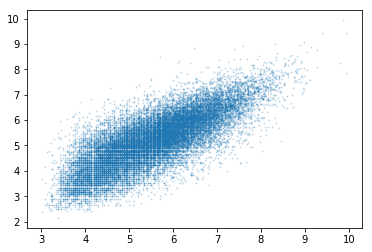

In [73]:
plt.scatter(CEL_df['GSM357845'],CEL_df['GSM1531514'],s=1,alpha=0.2)
plt.show()

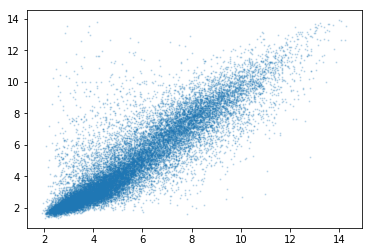

In [88]:
plt.scatter(np.array(Matrix['GSM1289343']),np.array(Matrix['GSM1537858']),s=1,alpha=0.2)
plt.show()

In [81]:
new_bad_keys = [i for i in bad_keys if i!='GSM_Zipped']

In [86]:
for key in new_bad_keys:
    print(key,info_Matrix[key]['VALUE'])
    if np.min(Matrix[key])<0:
        print(key)

GSM1289343  RMA background corrected log 2 transformed values
GSM1537858  Signal Intensity
GSM1289335  RMA background corrected log 2 transformed values
GSM921677  log2 RNA normalized
GSM921677
GSM1537849  Signal Intensity
GSM1537861  Signal Intensity
GSM1289340  RMA background corrected log 2 transformed values
GSM1537851  Signal Intensity
GSM1289341  RMA background corrected log 2 transformed values
GSM1289336  RMA background corrected log 2 transformed values
GSM1289339  RMA background corrected log 2 transformed values
GSM1289337  RMA background corrected log 2 transformed values
GSM1537860  Signal Intensity
GSM1289342  RMA background corrected log 2 transformed values
GSM1289338  RMA background corrected log 2 transformed values
GSM1537859  Signal Intensity
GSM921676  log2 RNA normalized
GSM921676
GSM1537850  Signal Intensity
GSM1537848  Signal Intensity
GSM1537852  Signal Intensity
GSM921675  log2 RNA normalized
GSM921675
GSM1537862  Signal Intensity
GSM1289343  RMA background co

In [84]:
for key in new_bad_keys:
    if 'log' in info_Matrix[key]['VALUE']:
        print(key,info_Matrix[key]['VALUE'])
    if not np.min(Matrix[key])<0:
        print(key)

ID_REF                                   
VALUE                 log2 RNA normalized
ABS_CALL                              NaN
DETECTION P-VALUE                     NaN
Name: GSM921676, dtype: object

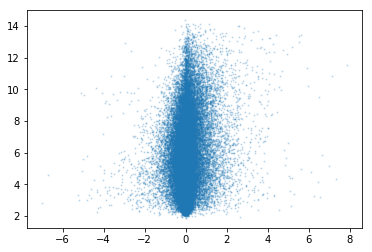

In [91]:
x_key = 'GSM921677'
y_key = 'GSM1289338'
# if 'log' in info_Matrix[x_key]['VALUE']:
#     x = 2**np.array(Matrix[x_key])
# else:
#     x = np.array(Matrix[x_key])
# if 'log' in info_Matrix[y_key]['VALUE']:
#     y = 2**np.array(Matrix[y_key])
# else:
#     y = np.array(Matrix[y_key])
x = np.array(Matrix[x_key])    
y = np.array(Matrix[y_key])
plt.scatter(x,y,s=1,alpha=0.2)
plt.show()

In [ ]:
Merge_df = CEL_df.copy()
for key in new_bad_keys:
    if np.min(Matrix[key])>0:
        Merge_df[key] = Matrix[key]

In [92]:
len(Matrix.index)

45101

In [94]:
merged_index = []
for idx in CEL_df.index:
    if idx in Matrix.index:
        merged_index.append(idx)
print(len(merged_index))

0


In [96]:
Matrix

,GSM1531520,GSM1531521,GSM1531522,GSM1531523,GSM1531524,GSM1531525,GSM1531517,GSM1531519,GSM1531518,GSM1531516,...,GSM94744,GSM94745,GSM94747,GSM94762,GSM94763,GSM94764,GSM703047,GSM703048,GSM703049,GSM703050
ID_REF,,,,,,,,,,,,,,,,,,,,,
AFFX-BioB-5_at,55.788700,68.415200,19.777100,88.736500,88.235100,26.507000,105.155000,33.200600,212.072000,105.846000,...,724.964872,444.628484,135.516688,106.205771,96.155576,277.364328,344.513890,365.854087,366.186351,450.811713
AFFX-BioB-M_at,82.784200,140.909000,38.693300,134.609000,132.065000,37.184800,172.950000,61.011200,396.250000,177.951000,...,1236.444082,749.470659,222.566920,188.454074,169.505409,419.792856,487.934832,569.522913,517.405325,806.646890
AFFX-BioB-3_at,54.604400,73.800000,23.068900,74.282800,87.634700,24.571700,96.867000,27.269000,243.898000,107.223000,...,1186.959653,700.711685,143.242018,153.771002,139.094688,393.810640,232.898131,415.263390,306.455019,480.443145
AFFX-BioC-5_at,191.935000,263.471000,205.358000,284.332000,245.934000,228.015000,330.866000,355.844000,684.941000,261.475000,...,1988.763475,1246.884606,401.660523,342.272253,292.462897,767.749467,1038.674569,1335.752502,1357.546305,1585.393533
AFFX-BioC-3_at,291.913000,396.553000,286.583000,377.967000,412.047000,339.558000,568.290000,514.984000,980.317000,363.670000,...,1466.046085,999.760995,364.893231,255.262559,254.270827,631.637662,1164.661989,1356.680051,1587.369761,1847.068027
AFFX-BioDn-5_at,409.002000,602.038000,701.740000,641.067000,582.451000,766.423000,781.638000,1103.650000,1554.200000,750.125000,...,3403.542666,2337.139203,774.518668,557.799986,591.346388,1234.361650,2010.063059,3325.338367,2304.545204,3789.350753
AFFX-BioDn-3_at,602.962000,839.012000,958.616000,857.434000,800.779000,1036.310000,1032.980000,1512.360000,1989.870000,1117.040000,...,6045.148774,4322.737993,1645.906104,1055.421037,1197.143516,2681.821016,5023.179141,6585.502635,6420.376186,7519.745734
AFFX-CreX-5_at,2808.980000,3711.500000,3383.400000,4131.810000,3667.490000,3582.650000,4789.450000,5172.160000,8356.660000,3569.530000,...,12824.525970,11578.024870,5130.554847,3415.801444,4153.370681,6337.574165,11745.712450,19470.464250,14480.287360,22317.954310
AFFX-CreX-3_at,2984.520000,4034.920000,3503.720000,4104.950000,3909.900000,3701.800000,4374.710000,5534.440000,8576.560000,3675.280000,...,12218.116070,10809.360180,5179.436348,3285.486116,3920.293274,6180.762396,14598.404320,22136.852560,18254.498950,23747.490510


In [102]:
new_CEL_index = [i[2:-1] for i in CEL_df.index]
merged_index = []
old_merged_index = []
for idx in CEL_df.index:
    new_idx = idx[2:-1]
    if new_idx in Matrix.index:
        merged_index.append(new_idx)
        old_merged_index.append(idx)

print(len(merged_index))

22690


In [100]:
len(new_CEL_index)

22690

In [104]:
old_merged_index

["b'1415670_at'",
 "b'1415671_at'",
 "b'1415672_at'",
 "b'1415673_at'",
 "b'1415674_a_at'",
 "b'1415675_at'",
 "b'1415676_a_at'",
 "b'1415677_at'",
 "b'1415678_at'",
 "b'1415679_at'",
 "b'1415680_at'",
 "b'1415681_at'",
 "b'1415682_at'",
 "b'1415683_at'",
 "b'1415684_at'",
 "b'1415685_at'",
 "b'1415686_at'",
 "b'1415687_a_at'",
 "b'1415688_at'",
 "b'1415689_s_at'",
 "b'1415690_at'",
 "b'1415691_at'",
 "b'1415692_s_at'",
 "b'1415693_at'",
 "b'1415694_at'",
 "b'1415695_at'",
 "b'1415696_at'",
 "b'1415697_at'",
 "b'1415698_at'",
 "b'1415699_a_at'",
 "b'1415700_a_at'",
 "b'1415701_x_at'",
 "b'1415702_a_at'",
 "b'1415703_at'",
 "b'1415704_a_at'",
 "b'1415705_at'",
 "b'1415706_at'",
 "b'1415707_at'",
 "b'1415708_at'",
 "b'1415709_s_at'",
 "b'1415710_at'",
 "b'1415711_at'",
 "b'1415712_at'",
 "b'1415713_a_at'",
 "b'1415714_a_at'",
 "b'1415715_at'",
 "b'1415716_a_at'",
 "b'1415717_at'",
 "b'1415718_at'",
 "b'1415719_s_at'",
 "b'1415720_s_at'",
 "b'1415721_a_at'",
 "b'1415722_a_at'",
 "b'141572

In [109]:
mask = []
for idx in Matrix.index:
    if idx in merged_index:
        mask.append(idx)

In [114]:
new_CEL_df = pd.DataFrame(data=np.array(CEL_df),index=new_CEL_index,columns=CEL_df.columns)
new_CEL_df

,GSM357845,GSM432169,GSM94744,GSM357850,GSM357843,GSM459836,GSM459844,GSM1531518,GSM188002,GSM1531524,...,GSM432172,GSM94764,GSM703050,GSM459849,GSM794242,GSM1531521,GSM1531523,GSM459845,GSM94771,GSM357839
1415670_at,4.699317,4.372178,3.235671,4.859036,3.599099,6.512481,6.439919,3.405170,3.849245,3.999411,...,4.095437,4.170768,4.511133,5.613846,4.319728,3.579358,4.499707,6.150764,4.183007,4.126178
1415671_at,4.654364,4.679109,3.648849,5.166069,5.168604,6.528198,6.225309,3.405170,4.004209,3.638805,...,5.167644,6.171007,5.205355,5.554104,4.749588,4.315437,4.006018,6.130314,3.905153,4.735965
1415672_at,3.677454,4.181952,2.753795,3.431663,3.681416,4.882846,4.303376,3.041706,3.736080,2.660329,...,4.393438,4.143229,4.642121,4.353456,4.579637,3.017377,3.067354,4.787543,4.240899,3.729861
1415673_at,6.006977,4.448922,3.648849,5.581448,5.445780,6.758837,7.106618,4.892332,4.767432,3.784698,...,4.733344,4.115873,5.868921,6.713506,4.949443,4.169690,4.231585,6.150764,4.724018,4.353264
1415674_a_at,7.250864,6.197224,4.480874,6.583201,7.004892,7.351346,7.207676,5.310950,5.450369,5.692522,...,6.418900,4.311095,6.117584,6.906243,5.830297,5.162714,5.305970,7.190319,4.631533,6.998261
1415675_at,5.736601,5.714223,4.013643,4.376016,6.237159,6.922390,5.995889,4.684230,4.043582,4.205422,...,5.580501,4.484592,5.346366,4.898931,5.125060,4.013046,4.006018,6.088525,5.093674,5.468531
1415676_a_at,4.377156,4.830629,3.588466,4.132969,4.728033,6.528198,5.926428,3.041706,4.324174,3.346354,...,5.897419,4.397218,6.329738,5.726717,5.611693,3.579358,4.158661,6.267724,4.097551,4.015025
1415677_at,5.789624,5.293374,3.293035,4.007104,5.509085,5.045006,5.995889,5.575819,4.767432,4.795811,...,5.461185,3.705227,4.976032,6.356605,5.669528,3.846064,4.499707,6.658926,4.013856,4.996543
1415678_at,4.743807,4.295726,3.468797,4.316580,4.511136,4.535664,4.404356,4.377456,3.887575,4.336199,...,4.469028,4.226387,4.334041,4.400856,4.388648,4.243931,4.980090,3.894239,3.905153,4.163639
1415679_at,5.118518,5.514835,3.123045,4.491753,5.445780,7.420349,6.567085,3.845236,4.283709,5.075695,...,5.580501,3.955786,6.117584,6.408477,5.551444,4.690877,5.192197,7.077351,3.878510,5.174060


In [138]:
filtered_Matrix = Matrix.loc[new_CEL_df.index]

In [120]:
filtered_Matrix

,GSM1531520,GSM1531521,GSM1531522,GSM1531523,GSM1531524,GSM1531525,GSM1531517,GSM1531519,GSM1531518,GSM1531516,...,GSM94744,GSM94745,GSM94747,GSM94762,GSM94763,GSM94764,GSM703047,GSM703048,GSM703049,GSM703050
1415670_at,398.241000,364.418000,413.752000,443.95700,396.547000,410.288000,309.30700,378.34600,371.451000,296.166000,...,774.820427,680.043576,1917.597516,1323.741101,1459.709046,1935.452640,1776.083194,1710.953576,1927.370257,1490.736777
1415671_at,333.749000,341.897000,362.554000,346.34900,311.303000,305.400000,316.80500,357.95700,389.618000,385.047000,...,603.568164,486.531737,562.703046,723.354810,668.373213,746.512289,3034.222404,3254.766597,2906.870285,2668.402648
1415672_at,1102.320000,1083.080000,1060.340000,1093.58000,1071.230000,971.912000,912.90200,938.01000,881.783000,1354.260000,...,1008.634134,1063.012377,1397.783378,979.895163,1307.783381,963.745051,5705.045369,5778.147994,5886.704282,6128.778076
1415673_at,1285.210000,1357.560000,1294.220000,1204.24000,1246.160000,946.749000,333.98800,318.13900,331.876000,328.906000,...,75.510241,35.209054,126.370603,91.353584,78.165182,95.645120,1537.631736,1570.345030,1703.326259,1771.410367
1415674_a_at,727.867000,658.119000,637.622000,681.30300,654.340000,710.101000,329.65400,383.34200,410.029000,456.917000,...,211.318626,141.181377,148.946497,120.708538,116.463457,190.358922,1822.332295,1479.655764,1923.802096,1978.479373
1415675_at,253.599000,231.588000,256.583000,238.72400,238.998000,273.516000,269.32200,269.35000,288.824000,306.803000,...,57.712069,67.234762,47.523215,54.561589,45.841984,78.226089,1596.241467,1439.227185,2033.472642,1793.382047
1415676_a_at,1266.890000,1483.530000,1541.290000,1618.45000,1524.550000,1601.540000,583.85900,649.37400,679.636000,658.980000,...,340.855934,288.838063,1046.013010,1151.838433,926.883162,1073.390262,3341.863389,3428.268096,3491.441467,3289.407069
1415677_at,55.710000,62.057800,74.451400,66.72810,77.635100,46.601100,69.28130,64.75540,70.773000,69.775700,...,31.061953,33.873358,152.219810,91.433068,121.348245,98.451342,698.759396,825.752706,484.430905,589.520554
1415678_at,350.080000,373.865000,363.493000,464.01000,419.924000,381.023000,311.25000,351.47200,352.235000,378.553000,...,1330.788363,1295.080472,961.446979,937.963556,1083.072715,1145.426269,2063.214683,2205.597687,2399.739927,2179.374789
1415679_at,916.657000,909.123000,817.752000,885.58300,805.774000,828.678000,1646.36000,1186.70000,1242.040000,1597.470000,...,657.401521,669.331817,775.913329,433.140524,462.069310,755.354137,6893.838679,5645.716189,7279.056129,6796.084942


In [128]:
temp_filtered_Matrix = filtered_Matrix.copy()
temp_filtered_Matrix.sort_index(inplace=True)
temp_filtered_Matrix

,GSM1531520,GSM1531521,GSM1531522,GSM1531523,GSM1531524,GSM1531525,GSM1531517,GSM1531519,GSM1531518,GSM1531516,...,GSM94744,GSM94745,GSM94747,GSM94762,GSM94763,GSM94764,GSM703047,GSM703048,GSM703049,GSM703050
1415670_at,398.241000,364.418000,413.752000,443.95700,396.547000,410.288000,309.30700,378.34600,371.451000,296.166000,...,774.820427,680.043576,1917.597516,1323.741101,1459.709046,1935.452640,1776.083194,1710.953576,1927.370257,1490.736777
1415671_at,333.749000,341.897000,362.554000,346.34900,311.303000,305.400000,316.80500,357.95700,389.618000,385.047000,...,603.568164,486.531737,562.703046,723.354810,668.373213,746.512289,3034.222404,3254.766597,2906.870285,2668.402648
1415672_at,1102.320000,1083.080000,1060.340000,1093.58000,1071.230000,971.912000,912.90200,938.01000,881.783000,1354.260000,...,1008.634134,1063.012377,1397.783378,979.895163,1307.783381,963.745051,5705.045369,5778.147994,5886.704282,6128.778076
1415673_at,1285.210000,1357.560000,1294.220000,1204.24000,1246.160000,946.749000,333.98800,318.13900,331.876000,328.906000,...,75.510241,35.209054,126.370603,91.353584,78.165182,95.645120,1537.631736,1570.345030,1703.326259,1771.410367
1415674_a_at,727.867000,658.119000,637.622000,681.30300,654.340000,710.101000,329.65400,383.34200,410.029000,456.917000,...,211.318626,141.181377,148.946497,120.708538,116.463457,190.358922,1822.332295,1479.655764,1923.802096,1978.479373
1415675_at,253.599000,231.588000,256.583000,238.72400,238.998000,273.516000,269.32200,269.35000,288.824000,306.803000,...,57.712069,67.234762,47.523215,54.561589,45.841984,78.226089,1596.241467,1439.227185,2033.472642,1793.382047
1415676_a_at,1266.890000,1483.530000,1541.290000,1618.45000,1524.550000,1601.540000,583.85900,649.37400,679.636000,658.980000,...,340.855934,288.838063,1046.013010,1151.838433,926.883162,1073.390262,3341.863389,3428.268096,3491.441467,3289.407069
1415677_at,55.710000,62.057800,74.451400,66.72810,77.635100,46.601100,69.28130,64.75540,70.773000,69.775700,...,31.061953,33.873358,152.219810,91.433068,121.348245,98.451342,698.759396,825.752706,484.430905,589.520554
1415678_at,350.080000,373.865000,363.493000,464.01000,419.924000,381.023000,311.25000,351.47200,352.235000,378.553000,...,1330.788363,1295.080472,961.446979,937.963556,1083.072715,1145.426269,2063.214683,2205.597687,2399.739927,2179.374789
1415679_at,916.657000,909.123000,817.752000,885.58300,805.774000,828.678000,1646.36000,1186.70000,1242.040000,1597.470000,...,657.401521,669.331817,775.913329,433.140524,462.069310,755.354137,6893.838679,5645.716189,7279.056129,6796.084942


In [131]:
temp_CEL_df = new_CEL_df.copy()
temp_CEL_df.sort_index(inplace=True)
temp_CEL_df

,GSM357845,GSM432169,GSM94744,GSM357850,GSM357843,GSM459836,GSM459844,GSM1531518,GSM188002,GSM1531524,...,GSM1289339,GSM1289337,GSM1537860,GSM1289342,GSM1289338,GSM1537859,GSM1537850,GSM1537848,GSM1537852,GSM1537862
1415670_at,4.699317,4.372178,3.235671,4.859036,3.599099,6.512481,6.439919,3.405170,3.849245,3.999411,...,8.90274,8.33998,NaN,8.57212,8.86572,NaN,NaN,NaN,NaN,NaN
1415671_at,4.654364,4.679109,3.648849,5.166069,5.168604,6.528198,6.225309,3.405170,4.004209,3.638805,...,11.20140,11.17340,11.475621,11.25010,10.94100,11.840260,12.025887,11.861800,11.858553,11.641650
1415672_at,3.677454,4.181952,2.753795,3.431663,3.681416,4.882846,4.303376,3.041706,3.736080,2.660329,...,11.28670,11.46260,10.615081,11.28530,11.18010,10.748951,10.768197,10.735754,10.661254,10.679548
1415673_at,6.006977,4.448922,3.648849,5.581448,5.445780,6.758837,7.106618,4.892332,4.767432,3.784698,...,6.20351,6.82758,7.007036,6.77523,6.41075,6.162389,6.665871,7.106147,7.176652,6.661170
1415674_a_at,7.250864,6.197224,4.480874,6.583201,7.004892,7.351346,7.207676,5.310950,5.450369,5.692522,...,9.85057,9.44673,9.486444,9.70161,9.92935,9.720830,9.336052,9.355718,9.326467,9.675211
1415675_at,5.736601,5.714223,4.013643,4.376016,6.237159,6.922390,5.995889,4.684230,4.043582,4.205422,...,9.44220,8.87163,8.371263,8.97766,9.22176,8.343986,8.285684,8.368053,8.339189,8.311806
1415676_a_at,4.377156,4.830629,3.588466,4.132969,4.728033,6.528198,5.926428,3.041706,4.324174,3.346354,...,11.31620,10.26540,10.849739,10.35350,11.08470,10.820736,10.387779,10.755133,10.705818,10.993013
1415677_at,5.789624,5.293374,3.293035,4.007104,5.509085,5.045006,5.995889,5.575819,4.767432,4.795811,...,9.64694,9.59813,8.660360,9.21900,9.44781,9.060256,9.499207,9.172662,9.290746,8.875460
1415678_at,4.743807,4.295726,3.468797,4.316580,4.511136,4.535664,4.404356,4.377456,3.887575,4.336199,...,9.74859,9.66538,NaN,9.64819,9.66327,NaN,NaN,NaN,NaN,NaN
1415679_at,5.118518,5.514835,3.123045,4.491753,5.445780,7.420349,6.567085,3.845236,4.283709,5.075695,...,11.53210,11.15410,11.161981,11.18810,11.38530,11.303563,11.320428,11.343407,11.324974,11.291916


In [132]:
for key in new_bad_keys:
    if np.min(Matrix[key])>0:
        temp_CEL_df[key] = temp_filtered_Matrix[key]
temp_CEL_df

,GSM357845,GSM432169,GSM94744,GSM357850,GSM357843,GSM459836,GSM459844,GSM1531518,GSM188002,GSM1531524,...,GSM1289339,GSM1289337,GSM1537860,GSM1289342,GSM1289338,GSM1537859,GSM1537850,GSM1537848,GSM1537852,GSM1537862
1415670_at,4.699317,4.372178,3.235671,4.859036,3.599099,6.512481,6.439919,3.405170,3.849245,3.999411,...,8.90274,8.33998,NaN,8.57212,8.86572,NaN,NaN,NaN,NaN,NaN
1415671_at,4.654364,4.679109,3.648849,5.166069,5.168604,6.528198,6.225309,3.405170,4.004209,3.638805,...,11.20140,11.17340,11.475621,11.25010,10.94100,11.840260,12.025887,11.861800,11.858553,11.641650
1415672_at,3.677454,4.181952,2.753795,3.431663,3.681416,4.882846,4.303376,3.041706,3.736080,2.660329,...,11.28670,11.46260,10.615081,11.28530,11.18010,10.748951,10.768197,10.735754,10.661254,10.679548
1415673_at,6.006977,4.448922,3.648849,5.581448,5.445780,6.758837,7.106618,4.892332,4.767432,3.784698,...,6.20351,6.82758,7.007036,6.77523,6.41075,6.162389,6.665871,7.106147,7.176652,6.661170
1415674_a_at,7.250864,6.197224,4.480874,6.583201,7.004892,7.351346,7.207676,5.310950,5.450369,5.692522,...,9.85057,9.44673,9.486444,9.70161,9.92935,9.720830,9.336052,9.355718,9.326467,9.675211
1415675_at,5.736601,5.714223,4.013643,4.376016,6.237159,6.922390,5.995889,4.684230,4.043582,4.205422,...,9.44220,8.87163,8.371263,8.97766,9.22176,8.343986,8.285684,8.368053,8.339189,8.311806
1415676_a_at,4.377156,4.830629,3.588466,4.132969,4.728033,6.528198,5.926428,3.041706,4.324174,3.346354,...,11.31620,10.26540,10.849739,10.35350,11.08470,10.820736,10.387779,10.755133,10.705818,10.993013
1415677_at,5.789624,5.293374,3.293035,4.007104,5.509085,5.045006,5.995889,5.575819,4.767432,4.795811,...,9.64694,9.59813,8.660360,9.21900,9.44781,9.060256,9.499207,9.172662,9.290746,8.875460
1415678_at,4.743807,4.295726,3.468797,4.316580,4.511136,4.535664,4.404356,4.377456,3.887575,4.336199,...,9.74859,9.66538,NaN,9.64819,9.66327,NaN,NaN,NaN,NaN,NaN
1415679_at,5.118518,5.514835,3.123045,4.491753,5.445780,7.420349,6.567085,3.845236,4.283709,5.075695,...,11.53210,11.15410,11.161981,11.18810,11.38530,11.303563,11.320428,11.343407,11.324974,11.291916


In [158]:
info_Matrix['GSM1289338']

ID_REF                                                                
VALUE                 RMA background corrected log 2 transformed va...
ABS_CALL                                                           NaN
DETECTION P-VALUE                                                  NaN
Name: GSM1289338, dtype: object

In [148]:
key = 'GSM1537862'
print(key)
len(Matrix[np.array(Matrix[key])==Matrix[key][0]])

GSM1537862


0

In [177]:
for key in temp_filtered_Matrix.keys():
    print(key,pd.Series(temp_filtered_Matrix[key]).isna().sum())

GSM1531520 0
GSM1531521 0
GSM1531522 0
GSM1531523 0
GSM1531524 0
GSM1531525 0
GSM1531517 0
GSM1531519 0
GSM1531518 0
GSM1531516 0
GSM1531511 0
GSM1531512 0
GSM1531513 0
GSM1531514 0
GSM1531515 0
GSM357849 0
GSM357850 0
GSM357852 0
GSM357853 0
GSM393942 0
GSM393943 0
GSM393944 0
GSM357843 0
GSM357845 0
GSM357839 0
GSM357841 0
GSM188001 0
GSM188003 0
GSM188004 0
GSM188005 0
GSM188006 0
GSM188002 0
GSM303489 22690
GSM303490 22690
GSM303491 22690
GSM432168 0
GSM432169 0
GSM432170 0
GSM432171 0
GSM432172 0
GSM432173 0
GSM709397 0
GSM709398 0
GSM709399 0
GSM794238 0
GSM794239 0
GSM794240 0
GSM794242 0
GSM794243 0
GSM794244 0
GSM921675 0
GSM921676 0
GSM921677 0
GSM461107 0
GSM516561 0
GSM516571 0
GSM516580 0
GSM1289335 0
GSM1289336 0
GSM1289337 0
GSM1289338 0
GSM1289340 0
GSM1289339 0
GSM1289341 0
GSM1289342 0
GSM1289343 0
GSM1537848 11343
GSM1537849 11343
GSM1537850 11343
GSM1537851 11343
GSM1537852 11343
GSM1537862 11343
GSM1537861 11343
GSM1537860 11343
GSM1537859 11343
GSM1537858 11343
GS

In [179]:
temp_filtered_Matrix['GSM303489']

1415670_at                     NaN
1415671_at                     NaN
1415672_at                     NaN
1415673_at                     NaN
1415674_a_at                   NaN
1415675_at                     NaN
1415676_a_at                   NaN
1415677_at                     NaN
1415678_at                     NaN
1415679_at                     NaN
1415680_at                     NaN
1415681_at                     NaN
1415682_at                     NaN
1415683_at                     NaN
1415684_at                     NaN
1415685_at                     NaN
1415686_at                     NaN
1415687_a_at                   NaN
1415688_at                     NaN
1415689_s_at                   NaN
1415690_at                     NaN
1415691_at                     NaN
1415692_s_at                   NaN
1415693_at                     NaN
1415694_at                     NaN
1415695_at                     NaN
1415696_at                     NaN
1415697_at                     NaN
1415698_at          

In [168]:
GSE62999_f = '/home/zach/PythonRepos/PyScripts/MERCI/GSE62999_series_matrix.txt'
GSE_Matrix = pd.read_csv(GSE62999_f,sep='\t',skiprows=range(68),index_col=0)

In [172]:
GSE_Matrix.sort_index(inplace=True)

In [173]:
GSE_Matrix

,GSM1537848,GSM1537849,GSM1537850,GSM1537851,GSM1537852,GSM1537853,GSM1537854,GSM1537855,GSM1537856,GSM1537857,GSM1537858,GSM1537859,GSM1537860,GSM1537861,GSM1537862,GSM1537863,GSM1537864,GSM1537865,GSM1537866,GSM1537867
ID_REF,,,,,,,,,,,,,,,,,,,,
!series_matrix_table_end,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1415671_at,11.861800,12.025887,11.745650,11.931923,11.858553,11.961270,12.058616,11.973634,12.045422,11.964416,11.646751,11.840260,11.475621,11.737876,11.641650,11.641753,11.753009,11.665806,11.767847,11.661103
1415672_at,10.735754,10.768197,10.653691,10.775902,10.661254,10.717521,10.735958,10.770067,10.669030,10.729678,10.778628,10.748951,10.615081,10.792276,10.679548,10.665506,10.711586,10.644914,10.695963,10.663086
1415673_at,7.106147,6.665871,7.514861,7.069852,7.176652,6.999164,6.642851,6.993515,6.721012,6.813703,6.857461,6.162389,7.007036,6.710565,6.661170,6.609055,6.093679,6.383228,6.199472,6.226639
1415674_a_at,9.355718,9.336052,9.149953,9.460433,9.326467,9.383418,9.285930,9.387023,9.221698,9.300220,9.673017,9.720830,9.486444,9.646522,9.675211,9.658786,9.723565,9.816673,9.754855,9.740993
1415675_at,8.368053,8.285684,8.337323,8.292941,8.339189,8.469558,8.236701,8.472547,8.144839,8.226267,8.426960,8.343986,8.371263,8.440092,8.311806,8.528625,8.203044,8.440278,8.375377,8.230600
1415676_a_at,10.755133,10.387779,10.721120,10.760776,10.705818,10.779060,10.265080,10.814668,10.352382,10.412357,11.061878,10.820736,10.849739,11.021662,10.993013,11.129300,10.796016,11.063610,10.751359,10.758459
1415677_at,9.172662,9.499207,8.943442,9.355492,9.290746,9.287041,9.399152,9.294951,9.396538,9.406038,8.961837,9.060256,8.660360,8.876983,8.875460,8.867883,8.846175,8.901485,8.929238,8.805240
1415679_at,11.343407,11.320428,11.162277,11.355413,11.324974,11.392563,11.377798,11.371932,11.347192,11.322985,11.178261,11.303563,11.161981,11.307678,11.291916,11.188222,11.315528,11.228525,11.277664,11.190046


In [170]:
GSE_Matrix.drop(index=[i for i in GSE_Matrix.index if not i in temp_CEL_df.index])

,GSM1537848,GSM1537849,GSM1537850,GSM1537851,GSM1537852,GSM1537853,GSM1537854,GSM1537855,GSM1537856,GSM1537857,GSM1537858,GSM1537859,GSM1537860,GSM1537861,GSM1537862,GSM1537863,GSM1537864,GSM1537865,GSM1537866,GSM1537867
ID_REF,,,,,,,,,,,,,,,,,,,,
1415671_at,11.861800,12.025887,11.745650,11.931923,11.858553,11.961270,12.058616,11.973634,12.045422,11.964416,11.646751,11.840260,11.475621,11.737876,11.641650,11.641753,11.753009,11.665806,11.767847,11.661103
1415672_at,10.735754,10.768197,10.653691,10.775902,10.661254,10.717521,10.735958,10.770067,10.669030,10.729678,10.778628,10.748951,10.615081,10.792276,10.679548,10.665506,10.711586,10.644914,10.695963,10.663086
1415673_at,7.106147,6.665871,7.514861,7.069852,7.176652,6.999164,6.642851,6.993515,6.721012,6.813703,6.857461,6.162389,7.007036,6.710565,6.661170,6.609055,6.093679,6.383228,6.199472,6.226639
1415674_a_at,9.355718,9.336052,9.149953,9.460433,9.326467,9.383418,9.285930,9.387023,9.221698,9.300220,9.673017,9.720830,9.486444,9.646522,9.675211,9.658786,9.723565,9.816673,9.754855,9.740993
1415675_at,8.368053,8.285684,8.337323,8.292941,8.339189,8.469558,8.236701,8.472547,8.144839,8.226267,8.426960,8.343986,8.371263,8.440092,8.311806,8.528625,8.203044,8.440278,8.375377,8.230600
1415676_a_at,10.755133,10.387779,10.721120,10.760776,10.705818,10.779060,10.265080,10.814668,10.352382,10.412357,11.061878,10.820736,10.849739,11.021662,10.993013,11.129300,10.796016,11.063610,10.751359,10.758459
1415677_at,9.172662,9.499207,8.943442,9.355492,9.290746,9.287041,9.399152,9.294951,9.396538,9.406038,8.961837,9.060256,8.660360,8.876983,8.875460,8.867883,8.846175,8.901485,8.929238,8.805240
1415679_at,11.343407,11.320428,11.162277,11.355413,11.324974,11.392563,11.377798,11.371932,11.347192,11.322985,11.178261,11.303563,11.161981,11.307678,11.291916,11.188222,11.315528,11.228525,11.277664,11.190046
1415681_at,9.601745,9.668011,9.423646,9.535107,9.483627,9.665097,9.672530,9.628151,9.647479,9.619617,9.480393,9.554645,9.226447,9.411367,9.333695,9.263305,9.435148,9.215389,9.395949,9.281108


In [181]:
for cell_type in expression_df['types'].unique():
    print(cell_type)
    good = []
    bad = []
    for GSM in expression_df[expression_df['types']==cell_type]['GSM number']:
        try:
            a = pd.Series(temp_filtered_Matrix[GSM]).isna().sum()
            if a>0:
                bad.append(GSM)
            else:
                good.append(GSM)
        except:
            continue
    print('Good: ',len(good))
    print('Bad: ',len(bad))

T cell
Good:  30
Bad:  0
NK cell
Good:  6
Bad:  0
Neutrophil
Good:  0
Bad:  3
Monocyte
Good:  18
Bad:  0
Mast cell
Good:  4
Bad:  0
Macrophage
Good:  9
Bad:  0
Eosinophils
Good:  0
Bad:  10
Dendritic cell
Good:  16
Bad:  0
B cell
Good:  11
Bad:  0


In [185]:
EOS2 = pd.read_csv(os.path.join(base_path,'GSM1707697_Eos_-_2.csv'),sep='\t')
EOS1 = pd.read_csv(os.path.join(base_path,'GSM1707696_Eos.csv'),sep='\t')

In [266]:
EOS2

,refseq_id,gene_id,chrom,txStart,txEnd,strand,TOT_R_0,RPKM_0
0,NM_008866,Lypla1,chr1,4807893,4846735,+,682,8.752910
1,NM_001159750,Tcea1,chr1,4857694,4897909,+,89,1.053100
2,NM_011541,Tcea1,chr1,4857694,4897909,+,89,1.051920
3,NM_001159751,Tcea1,chr1,4858328,4897909,+,0,0.000000
4,NM_133826,Atp6v1h,chr1,5083173,5162549,+,274,4.329860
5,NM_011011,Oprk1,chr1,5588493,5606133,+,0,0.000000
6,NM_001204371,Oprk1,chr1,5588493,5606133,+,0,0.000000
7,NM_009826,Rb1cc1,chr1,6214662,6276104,+,3023,13.396900
8,NM_001195732,Fam150a,chr1,6359331,6394731,+,0,0.000000
9,NM_001244692,St18,chr1,6487231,6860940,+,0,0.000000


In [191]:
bad_keys = ['GSM1537848','GSM1537849','GSM1537850','GSM1537851','GSM1537852','GSM1537862','GSM1537861','GSM1537860','GSM1537859','GSM1537858']
Array_df = temp_CEL_df.drop(columns=bad_keys)

In [192]:
Array_df

,GSM357845,GSM432169,GSM94744,GSM357850,GSM357843,GSM459836,GSM459844,GSM1531518,GSM188002,GSM1531524,...,GSM357839,GSM1289343,GSM1289335,GSM1289340,GSM1289341,GSM1289336,GSM1289339,GSM1289337,GSM1289342,GSM1289338
1415670_at,4.699317,4.372178,3.235671,4.859036,3.599099,6.512481,6.439919,3.405170,3.849245,3.999411,...,4.126178,8.62239,8.24126,8.70942,8.43722,8.52633,8.90274,8.33998,8.57212,8.86572
1415671_at,4.654364,4.679109,3.648849,5.166069,5.168604,6.528198,6.225309,3.405170,4.004209,3.638805,...,4.735965,11.37650,11.13090,11.04830,11.30660,11.24580,11.20140,11.17340,11.25010,10.94100
1415672_at,3.677454,4.181952,2.753795,3.431663,3.681416,4.882846,4.303376,3.041706,3.736080,2.660329,...,3.729861,11.28260,11.45830,11.21400,11.30770,11.44230,11.28670,11.46260,11.28530,11.18010
1415673_at,6.006977,4.448922,3.648849,5.581448,5.445780,6.758837,7.106618,4.892332,4.767432,3.784698,...,4.353264,6.87241,6.88159,6.48295,6.64169,6.98538,6.20351,6.82758,6.77523,6.41075
1415674_a_at,7.250864,6.197224,4.480874,6.583201,7.004892,7.351346,7.207676,5.310950,5.450369,5.692522,...,6.998261,9.85818,9.48842,9.86870,9.74287,9.45669,9.85057,9.44673,9.70161,9.92935
1415675_at,5.736601,5.714223,4.013643,4.376016,6.237159,6.922390,5.995889,4.684230,4.043582,4.205422,...,5.468531,9.03381,8.83436,9.33622,8.85549,8.97068,9.44220,8.87163,8.97766,9.22176
1415676_a_at,4.377156,4.830629,3.588466,4.132969,4.728033,6.528198,5.926428,3.041706,4.324174,3.346354,...,4.015025,10.47600,10.22460,11.04220,10.36290,10.42270,11.31620,10.26540,10.35350,11.08470
1415677_at,5.789624,5.293374,3.293035,4.007104,5.509085,5.045006,5.995889,5.575819,4.767432,4.795811,...,4.996543,9.30442,9.64835,9.38489,9.07034,9.77467,9.64694,9.59813,9.21900,9.44781
1415678_at,4.743807,4.295726,3.468797,4.316580,4.511136,4.535664,4.404356,4.377456,3.887575,4.336199,...,4.163639,9.75919,9.72289,9.52396,9.66524,9.64673,9.74859,9.66538,9.64819,9.66327
1415679_at,5.118518,5.514835,3.123045,4.491753,5.445780,7.420349,6.567085,3.845236,4.283709,5.075695,...,5.174060,11.28840,11.23940,11.38500,11.27110,11.20380,11.53210,11.15410,11.18810,11.38530


In [193]:
for cell_type in expression_df['types'].unique():
    print(cell_type)
    good = []
    bad = []
    for GSM in expression_df[expression_df['types']==cell_type]['GSM number']:
        try:
            a = pd.Series(Array_df[GSM]).isna().sum()
            if a>0:
                bad.append(GSM)
            else:
                good.append(GSM)
        except:
            continue
    print('Good: ',len(good))
    print('Bad: ',len(bad))

T cell
Good:  30
Bad:  0
NK cell
Good:  6
Bad:  0
Neutrophil
Good:  3
Bad:  0
Monocyte
Good:  15
Bad:  0
Mast cell
Good:  4
Bad:  0
Macrophage
Good:  9
Bad:  0
Eosinophils
Good:  0
Bad:  0
Dendritic cell
Good:  16
Bad:  0
B cell
Good:  11
Bad:  0


In [213]:
array_conversion = pd.read_csv('/home/zach/PythonRepos/PyScripts/MERCI/GPL1261-56135.txt',sep='\t',skiprows=16)

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning:

Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.



In [214]:
array_conversion

,ID,GB_ACC,SPOT_ID,Species Scientific Name,Annotation Date,Sequence Type,Sequence Source,Target Description,Representative Public ID,Gene Title,Gene Symbol,ENTREZ_GENE_ID,RefSeq Transcript ID,Gene Ontology Biological Process,Gene Ontology Cellular Component,Gene Ontology Molecular Function
0,1415670_at,BC024686,NaN,Mus musculus,"Oct 6, 2014",Consensus sequence,GenBank,gb:BC024686.1 /DB_XREF=gi:19354080 /FEA=FLmRNA...,BC024686,"coatomer protein complex, subunit gamma 1",Copg1,54161,NM_017477 /// NM_201244 /// XM_006506386,0006810 // transport // inferred from electron...,0000139 // Golgi membrane // not recorded /// ...,0005198 // structural molecule activity // inf...
1,1415671_at,NM_013477,NaN,Mus musculus,"Oct 6, 2014",Consensus sequence,GenBank,gb:NM_013477.1 /DB_XREF=gi:7304908 /GEN=Atp6v0...,NM_013477,"ATPase, H+ transporting, lysosomal V0 subunit D1",Atp6v0d1,11972,NM_013477,0006200 // ATP catabolic process // inferred f...,0005765 // lysosomal membrane // not recorded ...,0005515 // protein binding // inferred from el...
2,1415672_at,NM_020585,NaN,Mus musculus,"Oct 6, 2014",Consensus sequence,GenBank,gb:NM_020585.1 /DB_XREF=gi:10181207 /GEN=AB041...,NM_020585,"golgi autoantigen, golgin subfamily a, 7",Golga7,57437,NM_001042484 /// NM_020585 /// XM_006509179,0006893 // Golgi to plasma membrane transport ...,0000139 // Golgi membrane // not recorded /// ...,NaN
3,1415673_at,NM_133900,NaN,Mus musculus,"Oct 6, 2014",Consensus sequence,GenBank,gb:NM_133900.1 /DB_XREF=gi:19527115 /GEN=AI480...,NM_133900,phosphoserine phosphatase,Psph,100678,NM_133900 /// XM_006504274 /// XM_006504275,0006563 // L-serine metabolic process // not r...,0005737 // cytoplasm // not recorded /// 00430...,0000287 // magnesium ion binding // not record...
4,1415674_a_at,NM_021789,NaN,Mus musculus,"Oct 6, 2014",Consensus sequence,GenBank,gb:NM_021789.1 /DB_XREF=gi:11140824 /GEN=Sbdn ...,NM_021789,trafficking protein particle complex 4,Trappc4,60409,NM_021789 /// XM_006510523,0006810 // transport // inferred from electron...,0005622 // intracellular // inferred from elec...,0005515 // protein binding // inferred from ph...
5,1415675_at,BC008256,NaN,Mus musculus,"Oct 6, 2014",Consensus sequence,GenBank,gb:BC008256.1 /DB_XREF=gi:14198389 /FEA=FLmRNA...,BC008256,dolichol-phosphate (beta-D) mannosyltransferase 2,Dpm2,13481,NM_010073,0006486 // protein glycosylation // inferred f...,0000506 // glycosylphosphatidylinositol-N-acet...,0004582 // dolichyl-phosphate beta-D-mannosylt...
6,1415676_a_at,NM_011186,NaN,Mus musculus,"Oct 6, 2014",Consensus sequence,GenBank,gb:NM_011186.1 /DB_XREF=gi:6755203 /GEN=Psmb5 ...,NM_011186,"proteasome (prosome, macropain) subunit, beta ...",Psmb5,19173,NM_011186,0006508 // proteolysis // inferred from electr...,0000502 // proteasome complex // inferred from...,0004175 // endopeptidase activity // inferred ...
7,1415677_at,NM_026819,NaN,Mus musculus,"Oct 6, 2014",Consensus sequence,GenBank,gb:NM_026819.1 /DB_XREF=gi:13386167 /GEN=11100...,NM_026819,dehydrogenase/reductase (SDR family) member 1,Dhrs1,52585,NM_026819 /// XM_006519259,0008152 // metabolic process // inferred from ...,0005739 // mitochondrion // inferred from dire...,0016491 // oxidoreductase activity // inferred...
8,1415678_at,BC008595,NaN,Mus musculus,"Oct 6, 2014",Consensus sequence,GenBank,gb:BC008595.1 /DB_XREF=gi:14250330 /FEA=FLmRNA...,BC008595,"protein phosphatase 1A, magnesium dependent, a...",Ppm1a,19042,NM_008910 /// XM_006515600 /// XM_006515601 //...,0006470 // protein dephosphorylation // inferr...,0005634 // nucleus // not recorded /// 0005737...,0000287 // magnesium ion binding // inferred f...
9,1415679_at,NM_025498,NaN,Mus musculus,"Oct 6, 2014",Consensus sequence,GenBank,gb:NM_025498.1 /DB_XREF=gi:13384921 /GEN=17000...,NM_025498,presenilin enhancer 2 homolog (C. elegans),Psenen,66340,NM_025498,0006509 // membrane protein ectodomain proteol...,0005783 // endoplasmic reticulum // not record...,0005515 // protein binding // inferred from ph...


In [274]:
from tqdm import tqdm

In [283]:
gname = []
for ID in tqdm(Array_df.index):
    g = array_conversion[array_conversion.ID==ID]['Gene Symbol'].iloc[0]
    if isinstance(g,float):
        gname.append(g)
        continue
    if '///' in g:
        keepers = []
        for i in g.split(' /// '):
            if i in EOS2.gene_id.unique():
                keepers.append(i)
        if len(keepers)>0:
            gname.append(keepers[0])
        else:
            gname.append(i)
    else:
        gname.append(g)
    





  0%|          | 0/22690 [00:00<?, ?it/s]



  0%|          | 12/22690 [00:00<03:23, 111.38it/s]



  0%|          | 24/22690 [00:00<03:22, 112.11it/s]



  0%|          | 34/22690 [00:00<03:31, 107.06it/s]



  0%|          | 45/22690 [00:00<03:31, 107.26it/s]



  0%|          | 56/22690 [00:00<03:32, 106.44it/s]



  0%|          | 67/22690 [00:00<03:37, 103.89it/s]



  0%|          | 79/22690 [00:00<03:31, 106.75it/s]



  0%|          | 91/22690 [00:00<03:27, 109.10it/s]



  0%|          | 102/22690 [00:00<03:34, 105.29it/s]



  0%|          | 113/22690 [00:01<03:42, 101.54it/s]



  1%|          | 125/22690 [00:01<03:34, 105.15it/s]



  1%|          | 136/22690 [00:01<03:38, 103.34it/s]



  1%|          | 148/22690 [00:01<03:31, 106.35it/s]



  1%|          | 160/22690 [00:01<03:27, 108.79it/s]



  1%|          | 172/22690 [00:01<03:24, 109.88it/s]



  1%|          | 183/22690 [00:01<03:35, 104.67it/s]



  1%|          | 195/22690 [00:01<03:29, 107.19it/s]



  1%|  

 12%|█▏        | 2808/22690 [00:26<03:09, 105.18it/s]



 12%|█▏        | 2820/22690 [00:26<03:04, 107.81it/s]



 12%|█▏        | 2832/22690 [00:26<03:01, 109.66it/s]



 13%|█▎        | 2844/22690 [00:26<02:58, 111.18it/s]



 13%|█▎        | 2856/22690 [00:26<03:02, 108.72it/s]



 13%|█▎        | 2867/22690 [00:26<03:05, 106.93it/s]



 13%|█▎        | 2878/22690 [00:27<03:04, 107.64it/s]



 13%|█▎        | 2890/22690 [00:27<03:00, 109.43it/s]



 13%|█▎        | 2902/22690 [00:27<02:58, 110.94it/s]



 13%|█▎        | 2914/22690 [00:27<02:56, 112.02it/s]



 13%|█▎        | 2926/22690 [00:27<02:55, 112.67it/s]



 13%|█▎        | 2938/22690 [00:27<02:55, 112.79it/s]



 13%|█▎        | 2950/22690 [00:27<02:54, 112.98it/s]



 13%|█▎        | 2962/22690 [00:27<03:10, 103.81it/s]



 13%|█▎        | 2973/22690 [00:27<03:13, 101.67it/s]



 13%|█▎        | 2985/22690 [00:28<03:07, 104.97it/s]



 13%|█▎        | 2996/22690 [00:28<03:08, 104.53it/s]



 13%|█▎        | 3008/22690 [00

 25%|██▍       | 5610/22690 [00:52<02:29, 113.98it/s]



 25%|██▍       | 5622/22690 [00:52<02:29, 114.27it/s]



 25%|██▍       | 5634/22690 [00:52<02:29, 114.17it/s]



 25%|██▍       | 5646/22690 [00:52<02:29, 114.02it/s]



 25%|██▍       | 5658/22690 [00:52<02:29, 114.15it/s]



 25%|██▍       | 5670/22690 [00:52<02:29, 114.06it/s]



 25%|██▌       | 5682/22690 [00:52<02:33, 111.02it/s]



 25%|██▌       | 5694/22690 [00:52<02:31, 112.20it/s]



 25%|██▌       | 5706/22690 [00:53<02:30, 112.64it/s]



 25%|██▌       | 5718/22690 [00:53<02:30, 113.05it/s]



 25%|██▌       | 5730/22690 [00:53<02:29, 113.58it/s]



 25%|██▌       | 5742/22690 [00:53<02:32, 110.78it/s]



 25%|██▌       | 5754/22690 [00:53<02:35, 109.07it/s]



 25%|██▌       | 5766/22690 [00:53<02:37, 107.40it/s]



 25%|██▌       | 5778/22690 [00:53<02:35, 109.04it/s]



 26%|██▌       | 5790/22690 [00:53<02:32, 110.46it/s]



 26%|██▌       | 5802/22690 [00:53<02:30, 112.05it/s]



 26%|██▌       | 5814/22690 [00

 37%|███▋      | 8410/22690 [01:18<02:08, 111.15it/s]



 37%|███▋      | 8422/22690 [01:18<02:07, 112.14it/s]



 37%|███▋      | 8434/22690 [01:18<02:09, 109.79it/s]



 37%|███▋      | 8446/22690 [01:18<02:11, 108.19it/s]



 37%|███▋      | 8458/22690 [01:19<02:09, 109.81it/s]



 37%|███▋      | 8470/22690 [01:19<02:15, 105.28it/s]



 37%|███▋      | 8482/22690 [01:19<02:11, 107.68it/s]



 37%|███▋      | 8494/22690 [01:19<02:09, 109.40it/s]



 37%|███▋      | 8505/22690 [01:19<02:11, 107.71it/s]



 38%|███▊      | 8517/22690 [01:19<02:09, 109.49it/s]



 38%|███▊      | 8529/22690 [01:19<02:07, 110.82it/s]



 38%|███▊      | 8541/22690 [01:19<02:31, 93.53it/s] 



 38%|███▊      | 8553/22690 [01:19<02:22, 98.98it/s]



 38%|███▊      | 8564/22690 [01:20<02:20, 100.25it/s]



 38%|███▊      | 8576/22690 [01:20<02:15, 103.99it/s]



 38%|███▊      | 8588/22690 [01:20<02:12, 106.72it/s]



 38%|███▊      | 8600/22690 [01:20<02:09, 108.79it/s]



 38%|███▊      | 8612/22690 [01:

 49%|████▉     | 11193/22690 [01:44<01:42, 111.69it/s]



 49%|████▉     | 11205/22690 [01:44<01:42, 112.46it/s]



 49%|████▉     | 11217/22690 [01:44<01:41, 112.96it/s]



 49%|████▉     | 11229/22690 [01:44<01:43, 110.77it/s]



 50%|████▉     | 11241/22690 [01:45<01:42, 111.69it/s]



 50%|████▉     | 11253/22690 [01:45<01:41, 112.40it/s]



 50%|████▉     | 11265/22690 [01:45<01:41, 112.98it/s]



 50%|████▉     | 11277/22690 [01:45<01:40, 113.32it/s]



 50%|████▉     | 11289/22690 [01:45<01:46, 107.31it/s]



 50%|████▉     | 11301/22690 [01:45<01:44, 109.18it/s]



 50%|████▉     | 11312/22690 [01:45<01:45, 107.48it/s]



 50%|████▉     | 11324/22690 [01:45<01:43, 109.60it/s]



 50%|████▉     | 11336/22690 [01:45<01:42, 111.15it/s]



 50%|█████     | 11348/22690 [01:45<01:41, 111.87it/s]



 50%|█████     | 11360/22690 [01:46<01:40, 112.54it/s]



 50%|█████     | 11372/22690 [01:46<01:55, 98.02it/s] 



 50%|█████     | 11384/22690 [01:46<01:50, 102.32it/s]



 50%|█████    

 61%|██████▏   | 13931/22690 [02:10<01:20, 108.39it/s]



 61%|██████▏   | 13942/22690 [02:10<01:26, 101.38it/s]



 61%|██████▏   | 13953/22690 [02:10<01:33, 93.25it/s] 



 62%|██████▏   | 13965/22690 [02:10<01:28, 98.42it/s]



 62%|██████▏   | 13977/22690 [02:11<01:24, 102.75it/s]



 62%|██████▏   | 13989/22690 [02:11<01:22, 105.86it/s]



 62%|██████▏   | 14001/22690 [02:11<01:20, 108.47it/s]



 62%|██████▏   | 14013/22690 [02:11<01:18, 110.33it/s]



 62%|██████▏   | 14025/22690 [02:11<01:17, 111.59it/s]



 62%|██████▏   | 14037/22690 [02:11<01:19, 109.27it/s]



 62%|██████▏   | 14049/22690 [02:11<01:18, 110.77it/s]



 62%|██████▏   | 14061/22690 [02:11<01:19, 109.02it/s]



 62%|██████▏   | 14072/22690 [02:11<01:20, 107.40it/s]



 62%|██████▏   | 14084/22690 [02:12<01:18, 109.44it/s]



 62%|██████▏   | 14096/22690 [02:12<01:17, 110.66it/s]



 62%|██████▏   | 14108/22690 [02:12<01:18, 109.02it/s]



 62%|██████▏   | 14120/22690 [02:12<01:17, 110.43it/s]



 62%|██████▏   

 73%|███████▎  | 16667/22690 [02:36<00:58, 103.82it/s]



 74%|███████▎  | 16678/22690 [02:36<00:58, 103.49it/s]



 74%|███████▎  | 16690/22690 [02:36<00:56, 106.58it/s]



 74%|███████▎  | 16702/22690 [02:36<00:55, 108.55it/s]



 74%|███████▎  | 16714/22690 [02:36<00:54, 110.27it/s]



 74%|███████▎  | 16726/22690 [02:36<00:53, 111.29it/s]



 74%|███████▍  | 16738/22690 [02:36<00:53, 112.08it/s]



 74%|███████▍  | 16750/22690 [02:37<00:52, 112.70it/s]



 74%|███████▍  | 16762/22690 [02:37<00:52, 113.29it/s]



 74%|███████▍  | 16774/22690 [02:37<00:52, 113.63it/s]



 74%|███████▍  | 16786/22690 [02:37<00:51, 114.08it/s]



 74%|███████▍  | 16798/22690 [02:37<00:51, 113.81it/s]



 74%|███████▍  | 16810/22690 [02:37<00:53, 108.99it/s]



 74%|███████▍  | 16822/22690 [02:37<00:53, 110.35it/s]



 74%|███████▍  | 16834/22690 [02:37<00:55, 105.68it/s]



 74%|███████▍  | 16846/22690 [02:37<00:54, 108.05it/s]



 74%|███████▍  | 16858/22690 [02:38<00:53, 109.89it/s]



 74%|███████▍ 

 86%|████████▌ | 19430/22690 [03:01<00:28, 113.46it/s]



 86%|████████▌ | 19442/22690 [03:02<00:28, 113.61it/s]



 86%|████████▌ | 19454/22690 [03:02<00:28, 113.88it/s]



 86%|████████▌ | 19466/22690 [03:02<00:28, 113.89it/s]



 86%|████████▌ | 19478/22690 [03:02<00:28, 114.07it/s]



 86%|████████▌ | 19490/22690 [03:02<00:27, 114.32it/s]



 86%|████████▌ | 19502/22690 [03:02<00:27, 114.69it/s]



 86%|████████▌ | 19514/22690 [03:02<00:27, 114.54it/s]



 86%|████████▌ | 19526/22690 [03:02<00:29, 108.84it/s]



 86%|████████▌ | 19538/22690 [03:02<00:28, 110.51it/s]



 86%|████████▌ | 19550/22690 [03:02<00:28, 111.68it/s]



 86%|████████▌ | 19562/22690 [03:03<00:27, 112.10it/s]



 86%|████████▋ | 19574/22690 [03:03<00:28, 109.58it/s]



 86%|████████▋ | 19585/22690 [03:03<00:28, 107.68it/s]



 86%|████████▋ | 19597/22690 [03:03<00:28, 109.52it/s]



 86%|████████▋ | 19609/22690 [03:03<00:27, 110.81it/s]



 86%|████████▋ | 19621/22690 [03:03<00:27, 111.66it/s]



 87%|████████▋

 98%|█████████▊| 22167/22690 [03:27<00:04, 109.06it/s]



 98%|█████████▊| 22179/22690 [03:27<00:04, 110.59it/s]



 98%|█████████▊| 22191/22690 [03:27<00:04, 108.85it/s]



 98%|█████████▊| 22202/22690 [03:27<00:04, 106.91it/s]



 98%|█████████▊| 22214/22690 [03:28<00:04, 108.78it/s]



 98%|█████████▊| 22226/22690 [03:28<00:04, 110.60it/s]



 98%|█████████▊| 22238/22690 [03:28<00:04, 109.06it/s]



 98%|█████████▊| 22249/22690 [03:28<00:04, 107.03it/s]



 98%|█████████▊| 22260/22690 [03:28<00:04, 104.08it/s]



 98%|█████████▊| 22272/22690 [03:28<00:03, 106.85it/s]



 98%|█████████▊| 22283/22690 [03:28<00:03, 105.82it/s]



 98%|█████████▊| 22294/22690 [03:28<00:03, 105.37it/s]



 98%|█████████▊| 22306/22690 [03:28<00:03, 107.97it/s]



 98%|█████████▊| 22318/22690 [03:28<00:03, 109.86it/s]



 98%|█████████▊| 22330/22690 [03:29<00:03, 108.25it/s]



 98%|█████████▊| 22341/22690 [03:29<00:03, 93.55it/s] 



 99%|█████████▊| 22353/22690 [03:29<00:03, 98.74it/s]



 99%|█████████▊

In [284]:
gname

['Copg1',
 'Atp6v0d1',
 'Golga7',
 'Psph',
 'Trappc4',
 'Dpm2',
 'Psmb5',
 'Dhrs1',
 'Ppm1a',
 'Psenen',
 'Anapc1',
 'Mrpl43',
 'Xpo7',
 'Nmt1',
 'Atg5',
 'Mtif2',
 'Rab14',
 'Psap',
 'Ube2g1',
 'Zkscan3',
 'Mrpl27',
 'Dlg1',
 'Canx',
 'Derl1',
 'Wars',
 'Psma1',
 'Sar1a',
 'G3bp2',
 'Golm1',
 'Gps1',
 'Ssr3',
 'Rpl23',
 'Ctbp1',
 'Huwe1',
 'Cdv3',
 'Smim7',
 'Copa',
 'Anapc2',
 'Tug1',
 'Gbf1',
 'Cox18',
 'Arfgef1',
 'Zranb1',
 'Ddx24',
 'Snrnp27',
 'Tmem129',
 'Rps27',
 'Rnf220',
 'Sap30l',
 'Armc1',
 'Mad2l1bp',
 'Naa60',
 'Vta1',
 'Eif5',
 'Cdc42',
 'Rrn3',
 'Ankrd17',
 'Apoa1bp',
 'Pabpn1',
 'Pdpk1',
 'Cpsf7',
 'Angel2',
 'Abhd16a',
 'Tomm5',
 'Rab7',
 'Ddb1',
 'Pfdn5',
 'Rfk',
 'Txndc12',
 'Rbm42',
 'Psmc5',
 'Tmem165',
 'Aup1',
 'Hdac5',
 'Pfdn6',
 'Dscr3',
 'Cic',
 'Riok3',
 'Dctn5',
 'Rragc',
 'Tbl3',
 'Hp1bp3',
 'BC031181',
 'Abhd17a',
 'Polr2f',
 'Ube2v1',
 'Snapin',
 'Gbf1',
 'Fryl',
 'Lamtor5',
 'Atox1',
 'Mrpl52',
 'Mrpl52',
 'Tmem234',
 'Zbed6',
 'Hnrnpul2',
 'Sec22b',
 

In [285]:
Array_df['Gene Symbol'] = gname

In [287]:
Array_df['Gene Symbol']

1415670_at                         Copg1
1415671_at                      Atp6v0d1
1415672_at                        Golga7
1415673_at                          Psph
1415674_a_at                     Trappc4
1415675_at                          Dpm2
1415676_a_at                       Psmb5
1415677_at                         Dhrs1
1415678_at                         Ppm1a
1415679_at                        Psenen
1415680_at                        Anapc1
1415681_at                        Mrpl43
1415682_at                          Xpo7
1415683_at                          Nmt1
1415684_at                          Atg5
1415685_at                         Mtif2
1415686_at                         Rab14
1415687_a_at                        Psap
1415688_at                        Ube2g1
1415689_s_at                     Zkscan3
1415690_at                        Mrpl27
1415691_at                          Dlg1
1415692_s_at                        Canx
1415693_at                         Derl1
1415694_at      

In [288]:
aid = '1415672_at'
array_conversion[array_conversion.ID==aid]

,ID,GB_ACC,SPOT_ID,Species Scientific Name,Annotation Date,Sequence Type,Sequence Source,Target Description,Representative Public ID,Gene Title,Gene Symbol,ENTREZ_GENE_ID,RefSeq Transcript ID,Gene Ontology Biological Process,Gene Ontology Cellular Component,Gene Ontology Molecular Function
2,1415672_at,NM_020585,NaN,Mus musculus,"Oct 6, 2014",Consensus sequence,GenBank,gb:NM_020585.1 /DB_XREF=gi:10181207 /GEN=AB041...,NM_020585,"golgi autoantigen, golgin subfamily a, 7",Golga7,57437,NM_001042484 /// NM_020585 /// XM_006509179,0006893 // Golgi to plasma membrane transport ...,0000139 // Golgi membrane // not recorded /// ...,NaN


In [289]:
Array_df

,GSM357845,GSM432169,GSM94744,GSM357850,GSM357843,GSM459836,GSM459844,GSM1531518,GSM188002,GSM1531524,...,GSM1289343,GSM1289335,GSM1289340,GSM1289341,GSM1289336,GSM1289339,GSM1289337,GSM1289342,GSM1289338,Gene Symbol
1415670_at,4.699317,4.372178,3.235671,4.859036,3.599099,6.512481,6.439919,3.405170,3.849245,3.999411,...,8.62239,8.24126,8.70942,8.43722,8.52633,8.90274,8.33998,8.57212,8.86572,Copg1
1415671_at,4.654364,4.679109,3.648849,5.166069,5.168604,6.528198,6.225309,3.405170,4.004209,3.638805,...,11.37650,11.13090,11.04830,11.30660,11.24580,11.20140,11.17340,11.25010,10.94100,Atp6v0d1
1415672_at,3.677454,4.181952,2.753795,3.431663,3.681416,4.882846,4.303376,3.041706,3.736080,2.660329,...,11.28260,11.45830,11.21400,11.30770,11.44230,11.28670,11.46260,11.28530,11.18010,Golga7
1415673_at,6.006977,4.448922,3.648849,5.581448,5.445780,6.758837,7.106618,4.892332,4.767432,3.784698,...,6.87241,6.88159,6.48295,6.64169,6.98538,6.20351,6.82758,6.77523,6.41075,Psph
1415674_a_at,7.250864,6.197224,4.480874,6.583201,7.004892,7.351346,7.207676,5.310950,5.450369,5.692522,...,9.85818,9.48842,9.86870,9.74287,9.45669,9.85057,9.44673,9.70161,9.92935,Trappc4
1415675_at,5.736601,5.714223,4.013643,4.376016,6.237159,6.922390,5.995889,4.684230,4.043582,4.205422,...,9.03381,8.83436,9.33622,8.85549,8.97068,9.44220,8.87163,8.97766,9.22176,Dpm2
1415676_a_at,4.377156,4.830629,3.588466,4.132969,4.728033,6.528198,5.926428,3.041706,4.324174,3.346354,...,10.47600,10.22460,11.04220,10.36290,10.42270,11.31620,10.26540,10.35350,11.08470,Psmb5
1415677_at,5.789624,5.293374,3.293035,4.007104,5.509085,5.045006,5.995889,5.575819,4.767432,4.795811,...,9.30442,9.64835,9.38489,9.07034,9.77467,9.64694,9.59813,9.21900,9.44781,Dhrs1
1415678_at,4.743807,4.295726,3.468797,4.316580,4.511136,4.535664,4.404356,4.377456,3.887575,4.336199,...,9.75919,9.72289,9.52396,9.66524,9.64673,9.74859,9.66538,9.64819,9.66327,Ppm1a
1415679_at,5.118518,5.514835,3.123045,4.491753,5.445780,7.420349,6.567085,3.845236,4.283709,5.075695,...,11.28840,11.23940,11.38500,11.27110,11.20380,11.53210,11.15410,11.18810,11.38530,Psenen


In [295]:
len(EOS2.gene_id.unique())

23471

In [290]:
pickle.dump(Array_df,open(os.path.join(base_path,'Array_df.pkl'),'wb'))

In [333]:
Array_df = pickle.load(open(os.path.join(base_path,'Array_df.pkl'),'rb'))

In [ ]:
EOS2 = pd.read_csv(os.path.join(base_path,'GSM1707697_Eos_-_2.csv'),sep='\t')
EOS1 = pd.read_csv(os.path.join(base_path,'GSM1707696_Eos.csv'),sep='\t')

In [300]:
Limbus = pd.read_csv('/bigstore/GeneralStorage/Zach/MERCI/Graph-based Genes.csv')
Limbus.index = Limbus['FeatureName']
Limbus = Limbus.drop(columns=[i for i in Limbus.columns if 'Value' in i])
Limbus = Limbus.drop(columns=[i for i in Limbus.columns if 'Fold' in i])
Ave_Limbus = np.mean(Limbus.drop(columns=[i for i in Limbus.columns if not'Ave' in i]),axis=1)

In [301]:
Endo = pd.read_csv('/bigstore/binfo/mouse/Endothelial/GSE62974_FPKM_C166.txt',sep='\t',index_col=0)
Endo = Endo.drop(columns=[i for i in Endo.columns if not 'CTRL' in i])
Avg_Endo = np.mean(Endo,axis=1)

In [307]:
fname = '/bigstore/binfo/mouse/Cornea/GSE115355_161227_170125_epi_stroma_gene_RPKM.xlsx'
RPKM = pd.read_excel(fname,index_col=0)
Samples = RPKM.iloc[:4]
Expression = RPKM.iloc[4:]
Stroma_col = [i for i in Samples.columns if 'Stroma' in Samples[i].loc['Description']]
Epi_col = [i for i in Samples.columns if 'Epi' in Samples[i].loc['Tissue']]
Wounded_col = [i for i in Samples.columns if 'wounded' in Samples[i].loc['Description']]
untreated_col = [i for i in Samples.columns if 'untreate' in Samples[i].loc['Description']]
Epi_wounded_droppers = []
Epi_unwounded_droppers = []
Epi_untreated_droppers = []
Stroma_wounded_droppers = []
Stroma_unwounded_droppers = []
Stroma_untreated_droppers = []
for i in Samples.columns:
    if not i in Epi_col:
        Epi_wounded_droppers.append(i)
        Epi_unwounded_droppers.append(i)
        Epi_untreated_droppers.append(i)
    elif not i in untreated_col:
        Epi_wounded_droppers.append(i)
        Epi_unwounded_droppers.append(i)
        Epi_untreated_droppers.append(i)
    elif not i in Wounded_col:
        Epi_wounded_droppers.append(i)
    else:
        Epi_unwounded_droppers.append(i)
    if not i in Stroma_col:
        Stroma_wounded_droppers.append(i)
        Stroma_unwounded_droppers.append(i)
        Stroma_untreated_droppers.append(i)
    elif not i in untreated_col:
        Stroma_wounded_droppers.append(i)
        Stroma_unwounded_droppers.append(i)
        Stroma_untreated_droppers.append(i)
    elif not i in Wounded_col:
        Stroma_wounded_droppers.append(i)
    else:
        Stroma_unwounded_droppers.append(i)
        
untreated_Epi_RPKM = Expression.drop(columns=Epi_untreated_droppers)
wounded_untreated_Epi_RPKM = Expression.drop(columns=Epi_wounded_droppers)
unwounded_untreated_Epi_RPKM = Expression.drop(columns=Epi_unwounded_droppers)
#untreated_Epi_RPKM = untreated_Epi_RPKM[(np.mean(untreated_Epi_RPKM,axis=1)>1)&(np.mean(untreated_Epi_RPKM,axis=1)<500)]
wounded_untreated_Epi_RPKM = wounded_untreated_Epi_RPKM.loc[untreated_Epi_RPKM.index]
unwounded_untreated_Epi_RPKM = unwounded_untreated_Epi_RPKM.loc[untreated_Epi_RPKM.index]
ave_unwounded_untreated_Epi_RPKM = np.mean(unwounded_untreated_Epi_RPKM,axis=1)
ave_wounded_untreated_Epi_RPKM = np.mean(wounded_untreated_Epi_RPKM,axis=1)

untreated_Stroma_RPKM = Expression.drop(columns=Stroma_untreated_droppers)
wounded_untreated_Stroma_RPKM = Expression.drop(columns=Stroma_wounded_droppers)
unwounded_untreated_Stroma_RPKM = Expression.drop(columns=Stroma_unwounded_droppers)
#untreated_Stroma_RPKM = untreated_Stroma_RPKM[(np.mean(untreated_Stroma_RPKM,axis=1)>1)&(np.mean(untreated_Stroma_RPKM,axis=1)<500)]
wounded_untreated_Stroma_RPKM = wounded_untreated_Stroma_RPKM.loc[untreated_Stroma_RPKM.index]
unwounded_untreated_Stroma_RPKM = unwounded_untreated_Stroma_RPKM.loc[untreated_Stroma_RPKM.index]
ave_unwounded_untreated_Stroma_RPKM = np.mean(unwounded_untreated_Stroma_RPKM,axis=1)
ave_wounded_untreated_Stroma_RPKM = np.mean(wounded_untreated_Stroma_RPKM,axis=1)

In [308]:
ave_wounded_untreated_Epi_RPKM

Sample ID
0610005C13Rik     0.014052
0610007P14Rik    40.677325
0610009B22Rik    19.612025
0610009L18Rik     0.282840
0610009O20Rik     9.981978
0610010B08Rik     0.266002
0610010F05Rik     1.138624
0610010K14Rik    30.929675
0610011F06Rik    11.490975
0610012G03Rik     8.691730
0610030E20Rik     3.853458
0610031O16Rik     0.000000
0610037L13Rik    11.130975
0610038B21Rik     0.079914
0610039H22Rik     0.204010
0610039K10Rik     0.005462
0610040B10Rik     1.714655
0610040F04Rik     0.110584
0610040J01Rik     0.380764
0610043K17Rik     0.074028
1010001N08Rik     0.031913
1110001J03Rik     6.091242
1110002L01Rik     1.203070
1110004E09Rik    12.016958
1110004F10Rik    60.122175
1110006O24Rik     0.570145
1110007C09Rik    68.896525
1110008F13Rik    37.255425
1110008L16Rik     3.109343
1110008P14Rik    22.930825
                   ...    
Zscan26           5.089738
Zscan29           2.878455
Zscan4a           0.000000
Zscan4b           0.000000
Zscan4c           0.000000
Zscan4d           

In [327]:
ave_unwounded_untreated_Epi_RPKM.index.unique()

Index(['0610005C13Rik', '0610007P14Rik', '0610009B22Rik', '0610009L18Rik',
       '0610009O20Rik', '0610010B08Rik', '0610010F05Rik', '0610010K14Rik',
       '0610011F06Rik', '0610012G03Rik',
       ...
       'Zxda', 'Zxdb', 'Zxdc', 'Zyg11a', 'Zyg11b', 'Zyx', 'Zzef1', 'Zzz3', 'a',
       'l7Rn6'],
      dtype='object', name='Sample ID', length=24453)

In [297]:
genes = list(Array_df['Gene Symbol'].unique())
genes.extend(EOS2.gene_id.unique())
genes.extend(EOS1.gene_id.unique())
genes = np.unique(genes)

In [334]:
gene_dict = {}
gene_dict['array_genes'] = Array_df['Gene Symbol'].unique()
gene_dict['EOS2_genes'] = EOS2.gene_id.unique()
gene_dict['EOS1_genes'] = EOS1.gene_id.unique()
gene_dict['ave_unwounded_untreated_Epi_RPKM_genes'] = ave_unwounded_untreated_Epi_RPKM.index.unique()
gene_dict['ave_wounded_untreated_Epi_RPKM_genes'] = ave_wounded_untreated_Epi_RPKM.index.unique()
gene_dict['Avg_Endo_genes'] = Avg_Endo.index.unique()
gene_dict['Ave_Limbus_genes'] = Ave_Limbus.index.unique()
gene_dict['ave_unwounded_untreated_Stroma_RPKM_genes'] = ave_unwounded_untreated_Stroma_RPKM.index.unique()
gene_dict['ave_wounded_untreated_Stroma_RPKM_genes'] = ave_wounded_untreated_Stroma_RPKM.index.unique()


In [345]:
EOS2

,refseq_id,gene_id,chrom,txStart,txEnd,strand,TOT_R_0,RPKM_0
0,NM_008866,Lypla1,chr1,4807893,4846735,+,682,8.752910
1,NM_001159750,Tcea1,chr1,4857694,4897909,+,89,1.053100
2,NM_011541,Tcea1,chr1,4857694,4897909,+,89,1.051920
3,NM_001159751,Tcea1,chr1,4858328,4897909,+,0,0.000000
4,NM_133826,Atp6v1h,chr1,5083173,5162549,+,274,4.329860
5,NM_011011,Oprk1,chr1,5588493,5606133,+,0,0.000000
6,NM_001204371,Oprk1,chr1,5588493,5606133,+,0,0.000000
7,NM_009826,Rb1cc1,chr1,6214662,6276104,+,3023,13.396900
8,NM_001195732,Fam150a,chr1,6359331,6394731,+,0,0.000000
9,NM_001244692,St18,chr1,6487231,6860940,+,0,0.000000


In [ ]:
keys = list(Array_df.columns)
keys.extend(EOS2)

In [336]:
common_genes = []
gene_dict = {}
gene_dict['array_genes'] = Array_df['Gene Symbol'].unique()
gene_dict['EOS2_genes'] = EOS2.gene_id.unique()
gene_dict['EOS1_genes'] = EOS1.gene_id.unique()
gene_dict['ave_unwounded_untreated_Epi_RPKM_genes'] = ave_unwounded_untreated_Epi_RPKM.index.unique()
gene_dict['ave_wounded_untreated_Epi_RPKM_genes'] = ave_wounded_untreated_Epi_RPKM.index.unique()
gene_dict['Avg_Endo_genes'] = Avg_Endo.index.unique()
gene_dict['Ave_Limbus_genes'] = Ave_Limbus.index.unique()
gene_dict['ave_unwounded_untreated_Stroma_RPKM_genes'] = ave_unwounded_untreated_Stroma_RPKM.index.unique()
gene_dict['ave_wounded_untreated_Stroma_RPKM_genes'] = ave_wounded_untreated_Stroma_RPKM.index.unique()
from tqdm import tqdm
all_genes = list()
for key,l in gene_dict.items():
    all_genes.extend(l)
all_genes = np.unique(all_genes)
for gene in tqdm(all_genes):
    good=True
    for key,l in gene_dict.items():
        if gene not in l:
            good=False
            break
    if good==True:
        common_genes.append(gene)





  0%|          | 0/28436 [00:00<?, ?it/s]



  0%|          | 106/28436 [00:00<00:27, 1044.11it/s]



  1%|          | 284/28436 [00:00<00:23, 1190.84it/s]



  2%|▏         | 474/28436 [00:00<00:20, 1338.44it/s]



  2%|▏         | 653/28436 [00:00<00:19, 1447.84it/s]



  3%|▎         | 802/28436 [00:00<00:18, 1458.71it/s]



  3%|▎         | 959/28436 [00:00<00:18, 1488.10it/s]



  4%|▍         | 1101/28436 [00:00<00:18, 1460.01it/s]



  4%|▍         | 1275/28436 [00:00<00:17, 1533.05it/s]



  5%|▌         | 1480/28436 [00:00<00:16, 1657.95it/s]



  6%|▌         | 1697/28436 [00:01<00:14, 1784.08it/s]



  7%|▋         | 1894/28436 [00:01<00:14, 1834.86it/s]



  7%|▋         | 2084/28436 [00:01<00:14, 1845.21it/s]



  8%|▊         | 2281/28436 [00:01<00:13, 1879.78it/s]



  9%|▊         | 2484/28436 [00:01<00:13, 1921.44it/s]



  9%|▉         | 2678/28436 [00:01<00:14, 1766.47it/s]



 10%|█         | 2859/28436 [00:01<00:20, 1274.11it/s]



 11%|█         | 3009/28436 [

 87%|████████▋ | 24684/28436 [00:27<00:05, 742.68it/s]



 87%|████████▋ | 24763/28436 [00:27<00:05, 723.66it/s]



 87%|████████▋ | 24839/28436 [00:27<00:05, 690.21it/s]



 88%|████████▊ | 24911/28436 [00:27<00:05, 681.48it/s]



 88%|████████▊ | 24987/28436 [00:27<00:04, 701.11it/s]



 88%|████████▊ | 25059/28436 [00:27<00:04, 700.39it/s]



 88%|████████▊ | 25133/28436 [00:27<00:04, 708.41it/s]



 89%|████████▊ | 25231/28436 [00:27<00:04, 772.60it/s]



 89%|████████▉ | 25311/28436 [00:28<00:04, 749.67it/s]



 89%|████████▉ | 25388/28436 [00:28<00:04, 748.94it/s]



 90%|████████▉ | 25465/28436 [00:28<00:04, 725.73it/s]



 90%|████████▉ | 25539/28436 [00:28<00:04, 711.57it/s]



 90%|█████████ | 25611/28436 [00:28<00:04, 687.76it/s]



 90%|█████████ | 25681/28436 [00:28<00:04, 674.97it/s]



 91%|█████████ | 25757/28436 [00:28<00:03, 698.32it/s]



 91%|█████████ | 25856/28436 [00:28<00:03, 765.38it/s]



 91%|█████████ | 25942/28436 [00:28<00:03, 791.33it/s]



 92%|█████████

In [344]:
pickle.dump(common_genes,open('/bigstore/GeneralStorage/Zach/MERCI/common_genes.pkl','wb'))

In [337]:
len(common_genes)

10841

In [335]:
for key,l in gene_dict.items():
    print(key,len(l))

array_genes 13453
EOS2_genes 23471
EOS1_genes 23471
ave_unwounded_untreated_Epi_RPKM_genes 24453
ave_wounded_untreated_Epi_RPKM_genes 24453
Avg_Endo_genes 22552
Ave_Limbus_genes 18241
ave_unwounded_untreated_Stroma_RPKM_genes 24453
ave_wounded_untreated_Stroma_RPKM_genes 24453


In [338]:
common_genes = np.unique(common_genes)

In [339]:
len(common_genes)

10841

In [351]:
key = Array_df.columns[0]
gkey = 'Gene Symbol'
keys = [key,gkey]
temp_df = Array_df.copy()
def column_generator(key,gkey,Array_df,common_genes):
    keys = [key,gkey]
    temp_df = Array_df.copy()
    temp_df = temp_df.drop(columns=[i for i in Array_df.columns if not i in keys])
    column = []
    for gene in common_genes:
        column.append(np.sum(temp_df[temp_df[gkey]==gene][key]))
    pd.DataFrame(data = column,index=list(common_genes))
    return pd.DataFrame(data = column,index=list(common_genes),columns=[key]),key
# column = column_generator(key,gkey,Array_df,common_genes)
# column

In [354]:
import multiprocessing
from functools import partial
pfunc = partial(column_generator,gkey=gkey,Array_df=Array_df,common_genes=common_genes)
master_df = pd.DataFrame(index=common_genes)
ncpu = 10
with multiprocessing.Pool(ncpu) as p:
    for column,key in p.imap(pfunc,list(Array_df.columns)):
        print(key)
        master_df[key] = column

GSM357845
GSM432169
GSM94744
GSM357850
GSM357843
GSM459836
GSM459844
GSM1531518
GSM188002
GSM1531524
GSM703047
GSM1531516
GSM303489
GSM459841
GSM459838
GSM709397
GSM1531512
GSM516561
GSM794243
GSM357841
GSM459842
GSM393943
GSM188005
GSM432170
GSM516571
GSM1531514
GSM794239
GSM459835
GSM459848
GSM94768
GSM461107
GSM357849
GSM94747
GSM94769
GSM794238
GSM357852
GSM94741
GSM459847
GSM393944
GSM432173
GSM303490
GSM703049
GSM94745
GSM709399
GSM357853
GSM432168
GSM1531525
GSM1531517
GSM459843
GSM188004
GSM1531511
GSM459850
GSM94762
GSM459846
GSM516580
GSM794240
GSM459837
GSM94763
GSM709398
GSM703048
GSM188006
GSM432171
GSM1531515
GSM393942
GSM1531519
GSM794244
GSM303491
GSM459839
GSM1531522
GSM459840
GSM1531513
GSM188003
GSM94772
GSM188001
GSM1531520
GSM432172
GSM94764
GSM703050
GSM459849
GSM794242
GSM1531521
GSM1531523
GSM459845
GSM94771
GSM357839
GSM1289343
GSM1289335
GSM1289340
GSM1289341
GSM1289336
GSM1289339
GSM1289337
GSM1289342
GSM1289338
Gene Symbol


In [357]:
master_df = master_df.drop(columns='Gene Symbol')

In [ ]:
EOS2.loc[common_genes]

In [363]:
name = 'EOS2'
key = 'RPKM_0'
gkey = 'gene_id'
keys = [key,gkey]
df = EOS2
column = []
temp_df = df.drop(columns=[i for i in df.columns if not i in keys])
for gene in common_genes:
    column.append(np.sum(temp_df[temp_df[gkey]==gene][key]))
column = pd.DataFrame(data=column,index=common_genes,columns=[name])
master_df[name] = column

In [366]:
name = 'EOS1'
key = 'RPKM_0'
gkey = 'gene_id'
keys = [key,gkey]
df = EOS1
column = []
temp_df = df.drop(columns=[i for i in df.columns if not i in keys])
for gene in common_genes:
    column.append(np.sum(temp_df[temp_df[gkey]==gene][key]))
column = pd.DataFrame(data=column,index=common_genes,columns=[name])
master_df[name] = column

In [369]:
Ave_Limbus.loc[gene]

0.7413482808945953

In [371]:
name = 'Limbus'
column = []
temp_df = Ave_Limbus
for gene in common_genes:
    column.append(np.sum(temp_df.loc[gene]))
column = pd.DataFrame(data=column,index=common_genes,columns=[name])
master_df[name] = column

In [372]:
name = 'Endothelium'
column = []
temp_df = Avg_Endo
for gene in common_genes:
    column.append(np.sum(temp_df.loc[gene]))
column = pd.DataFrame(data=column,index=common_genes,columns=[name])
master_df[name] = column

In [374]:
ave_unwounded_untreated_Epi_RPKM

Sample ID
0610005C13Rik    3.946743e-02
0610007P14Rik    3.412080e+01
0610009B22Rik    3.100750e+01
0610009L18Rik    8.654380e-01
0610009O20Rik    1.085589e+01
0610010B08Rik    3.070655e-01
0610010F05Rik    4.554922e-01
0610010K14Rik    3.516825e+01
0610011F06Rik    2.002047e+01
0610012G03Rik    8.673715e+00
0610030E20Rik    5.031408e+00
0610031O16Rik    3.690475e-02
0610037L13Rik    1.594068e+01
0610038B21Rik    9.094933e-02
0610039H22Rik    1.973017e-01
0610039K10Rik    1.540743e-02
0610040B10Rik    3.327648e+00
0610040F04Rik    1.070572e-01
0610040J01Rik    2.762527e-01
0610043K17Rik    1.645177e-01
1010001N08Rik    1.123473e-01
1110001J03Rik    8.055650e+00
1110002L01Rik    1.776495e+00
1110004E09Rik    1.205044e+01
1110004F10Rik    5.449835e+01
1110006O24Rik    6.060560e-01
1110007C09Rik    4.982252e+01
1110008F13Rik    3.247825e+01
1110008L16Rik    2.981430e+00
1110008P14Rik    3.184893e+01
                     ...     
Zscan26          7.931468e+00
Zscan29          3.144025e+00


In [375]:
name = 'Control_Epithelium'
column = []
temp_df = ave_unwounded_untreated_Epi_RPKM
for gene in common_genes:
    column.append(np.sum(temp_df.loc[gene]))
column = pd.DataFrame(data=column,index=common_genes,columns=[name])
master_df[name] = column

In [376]:
name = 'Wounded_Epithelium'
column = []
temp_df = ave_wounded_untreated_Epi_RPKM
for gene in common_genes:
    column.append(np.sum(temp_df.loc[gene]))
column = pd.DataFrame(data=column,index=common_genes,columns=[name])
master_df[name] = column

In [377]:
name = 'Control_Stroma'
column = []
temp_df = ave_unwounded_untreated_Stroma_RPKM
for gene in common_genes:
    column.append(np.sum(temp_df.loc[gene]))
column = pd.DataFrame(data=column,index=common_genes,columns=[name])
master_df[name] = column
name = 'Wounded_Stroma'
column = []
temp_df = ave_wounded_untreated_Stroma_RPKM
for gene in common_genes:
    column.append(np.sum(temp_df.loc[gene]))
column = pd.DataFrame(data=column,index=common_genes,columns=[name])
master_df[name] = column

In [378]:
master_df

,GSM357845,GSM432169,GSM94744,GSM357850,GSM357843,GSM459836,GSM459844,GSM1531518,GSM188002,GSM1531524,...,GSM1289342,GSM1289338,EOS2,EOS1,Limbus,Endothelium,Control_Epithelium,Wounded_Epithelium,Control_Stroma,Wounded_Stroma
0610007P14Rik,4.470705,4.295726,3.178995,3.686695,4.422812,4.309412,4.098902,3.405170,3.965072,3.784698,...,9.22036,8.41633,3.557340,6.940630,0.859622,30.821567,34.120800,4.067732e+01,28.354125,34.636725
0610009B22Rik,6.380413,5.818623,4.074005,4.859036,6.733826,7.984681,7.726680,3.405170,3.699004,4.399334,...,9.74416,8.76852,4.359800,8.374900,0.493870,35.418233,31.007500,1.961202e+01,29.725875,35.351350
0610009O20Rik,10.850297,12.715692,7.602786,12.672669,11.382057,15.511492,14.683547,10.619616,12.804794,10.122419,...,11.39502,10.99700,1.558680,2.715270,0.197152,15.302300,10.855892,9.981978e+00,11.487535,12.215125
0610010K14Rik,13.336824,12.976823,8.793303,13.583181,13.352165,15.800920,14.867746,10.885878,11.319206,11.762830,...,14.76352,13.58504,3.534390,5.691473,0.471433,30.316000,35.168250,3.092967e+01,26.346475,48.022600
0610012G03Rik,16.029877,18.646374,9.833287,14.308233,15.800262,19.056469,18.998695,14.438690,13.459084,13.930574,...,25.78534,23.94680,2.080290,3.217160,0.971662,15.873933,8.673715,8.691730e+00,12.349100,21.766775
0610037L13Rik,26.163486,23.861507,14.901880,25.601044,26.190695,29.669634,28.585848,19.512619,19.409788,21.897158,...,24.32969,23.66769,2.476300,5.302800,0.603251,8.786817,15.940675,1.113098e+01,16.291125,20.248250
0610040J01Rik,5.156922,4.905235,3.123045,4.547929,4.511136,6.648122,6.062160,3.041706,4.122965,4.690689,...,5.57461,6.00894,0.500945,0.279251,0.001003,0.154765,0.276253,3.807638e-01,0.200784,0.358247
1110001J03Rik,3.677454,4.602575,3.067852,3.622519,4.422812,5.374142,4.454333,2.774951,3.314808,3.202229,...,7.26880,7.49043,4.389990,10.805200,0.831709,28.055633,8.055650,6.091242e+00,14.824025,27.400325
1110004E09Rik,23.004936,22.167614,15.207949,21.576591,24.146202,29.532597,27.302692,18.905437,20.618946,21.131287,...,23.28949,22.18056,0.698078,1.599600,0.425343,11.120833,12.050442,1.201696e+01,13.864225,19.091100
1110004F10Rik,6.512696,4.525782,3.831242,3.686695,5.657516,5.535041,5.091187,4.507124,4.445840,5.720152,...,9.45362,9.15457,7.025750,10.886900,2.172716,69.991333,54.498350,6.012217e+01,46.869750,54.465225


In [393]:
pickle.dump(master_df,open(os.path.join(base_path,'MERCI_Matrix_Expanded.pkl'),'wb'))

In [410]:
merged_df = pd.DataFrame(index=master_df.index)
for key in expression_df.types.unique():
    keys = list(expression_df[expression_df.types==key]['GSM number'])
    temp_df = master_df.copy()
    temp_df = temp_df.drop(columns=[i for i in master_df.columns if not i in keys])
    merged_df[key] = np.mean(temp_df,axis=1)

In [411]:
merged_df

,T cell,NK cell,Neutrophil,Monocyte,Mast cell,Macrophage,Eosinophils,Dendritic cell,B cell,Limbus,Endothelium,Epithelium,Stroma
0610007P14Rik,3.957247,4.008008,3.428112,4.681801,3.630504,8.813521,5.248985,3.793561,3.697462,0.859622,30.821567,37.399062,31.495425
0610009B22Rik,5.134661,4.077620,5.255640,6.005324,5.253486,9.396093,6.367350,7.781640,4.376867,0.493870,35.418233,25.309762,32.538612
0610009O20Rik,11.394799,12.331928,9.971729,13.593509,10.411208,11.351466,2.136975,14.789832,9.500891,0.197152,15.302300,10.418935,11.851330
0610010K14Rik,11.945892,10.837496,11.651968,14.033081,10.720692,14.476060,4.612932,14.753923,10.547707,0.471433,30.316000,33.048963,37.184538
0610012G03Rik,15.498642,14.144822,15.586527,18.737774,15.719525,25.398356,2.648725,18.165690,12.447691,0.971662,15.873933,8.682723,17.057937
0610037L13Rik,23.363209,19.712214,20.158632,24.731491,19.144331,24.080688,3.889550,27.684406,19.264345,0.603251,8.786817,13.535825,18.269687
0610040J01Rik,4.600578,4.249944,4.138657,5.295375,4.097733,5.532590,0.390098,6.057069,3.786906,0.001003,0.154765,0.328508,0.279516
1110001J03Rik,3.670189,3.731092,3.152876,4.396921,3.425290,7.260120,7.597595,4.347114,3.502249,0.831709,28.055633,7.073446,21.112175
1110004E09Rik,21.796854,20.520909,19.707435,23.806856,18.563007,22.852900,1.148839,27.691103,18.117791,0.425343,11.120833,12.033700,16.477663
1110004F10Rik,5.014932,4.543501,3.001378,4.783288,7.965705,9.346103,8.956325,4.736884,4.076852,2.172716,69.991333,57.310262,50.667488


In [412]:
pickle.dump(merged_df,open(os.path.join(base_path,'MERCI_Matrix_Merged.pkl'),'wb'))

In [457]:
norm_merged_df = np.subtract(merged_df,np.percentile(merged_df,0.1,axis=0))
norm_merged_df = np.divide(norm_merged_df,np.percentile(norm_merged_df,99.9,axis=0))
norm_merged_df

,T cell,NK cell,Neutrophil,Monocyte,Mast cell,Macrophage,Eosinophils,Dendritic cell,B cell,Limbus,Endothelium,Epithelium,Stroma
0610007P14Rik,0.019531,0.013602,0.022445,0.024713,0.015221,0.098375,0.006991,0.003033,0.009097,0.007556,0.018704,0.011467,1.107634e-02
0610009B22Rik,0.051168,0.015585,0.073075,0.055367,0.061988,0.107105,0.008481,0.088069,0.031243,0.004341,0.021494,0.007760,1.144321e-02
0610009O20Rik,0.219379,0.250821,0.203730,0.231118,0.210613,0.136406,0.002846,0.237502,0.198268,0.001732,0.009286,0.003195,4.167887e-03
0610010K14Rik,0.234187,0.208232,0.250279,0.241299,0.219531,0.183229,0.006144,0.236736,0.232391,0.004144,0.018397,0.010133,1.307709e-02
0610012G03Rik,0.329651,0.302485,0.359282,0.350265,0.363576,0.346903,0.003528,0.309484,0.294324,0.008541,0.009633,0.002662,5.998952e-03
0610037L13Rik,0.540973,0.461148,0.485948,0.489087,0.462265,0.327157,0.005180,0.512447,0.516523,0.005302,0.005332,0.004150,6.425101e-03
0610040J01Rik,0.036817,0.020496,0.042130,0.038924,0.028684,0.049209,0.000520,0.051297,0.012012,0.000008,0.000094,0.000101,9.830041e-05
1110001J03Rik,0.011817,0.005710,0.014820,0.018115,0.009307,0.075097,0.010119,0.014837,0.002733,0.007311,0.017026,0.002169,7.424750e-03
1110004E09Rik,0.498885,0.484194,0.473448,0.467671,0.445513,0.308758,0.001530,0.512590,0.479149,0.003738,0.006749,0.003690,5.794880e-03
1110004F10Rik,0.047951,0.028862,0.010623,0.027064,0.140143,0.106356,0.011929,0.023148,0.021463,0.019100,0.042474,0.017572,1.781879e-02


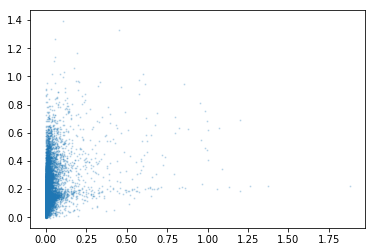

In [458]:
plt.scatter(np.log2(norm_merged_df['Endothelium']+1),np.log2(norm_merged_df['Macrophage']+1),s=1,alpha=0.2)

# plt.scatter(norm_merged_df['T cell'],norm_merged_df['Epithelium'],s=1,alpha=0.2)
plt.show()

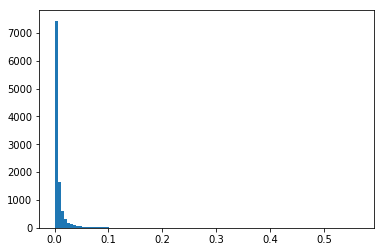

In [459]:
plt.hist(np.log10(norm_merged_df['Endothelium']+1),bins=100)
plt.show()

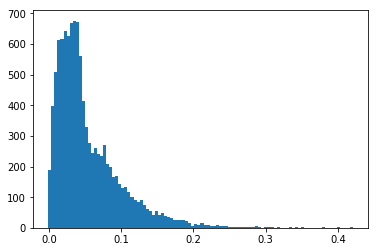

In [460]:
plt.hist(np.log10(norm_merged_df['Macrophage']+1),bins=100)
plt.show()

In [443]:
spearmanr(norm_merged_df['Endothelium'],norm_merged_df['Macrophage'])

SpearmanrResult(correlation=0.5454544536564152, pvalue=0.0)

In [ ]:
merged_df = pd.DataFrame(index=master_df.index)
for key in expression_df.types.unique():
    keys = list(expression_df[expression_df.types==key]['GSM number'])
    temp_df = master_df.copy()
    temp_df = temp_df.drop(columns=[i for i in master_df.columns if not i in keys])
    merged_df[key] = np.mean(temp_df,axis=1)

In [447]:
Array_df

,GSM357845,GSM432169,GSM94744,GSM357850,GSM357843,GSM459836,GSM459844,GSM1531518,GSM188002,GSM1531524,...,GSM1289343,GSM1289335,GSM1289340,GSM1289341,GSM1289336,GSM1289339,GSM1289337,GSM1289342,GSM1289338,Gene Symbol
1415670_at,4.699317,4.372178,3.235671,4.859036,3.599099,6.512481,6.439919,3.405170,3.849245,3.999411,...,8.62239,8.24126,8.70942,8.43722,8.52633,8.90274,8.33998,8.57212,8.86572,Copg1
1415671_at,4.654364,4.679109,3.648849,5.166069,5.168604,6.528198,6.225309,3.405170,4.004209,3.638805,...,11.37650,11.13090,11.04830,11.30660,11.24580,11.20140,11.17340,11.25010,10.94100,Atp6v0d1
1415672_at,3.677454,4.181952,2.753795,3.431663,3.681416,4.882846,4.303376,3.041706,3.736080,2.660329,...,11.28260,11.45830,11.21400,11.30770,11.44230,11.28670,11.46260,11.28530,11.18010,Golga7
1415673_at,6.006977,4.448922,3.648849,5.581448,5.445780,6.758837,7.106618,4.892332,4.767432,3.784698,...,6.87241,6.88159,6.48295,6.64169,6.98538,6.20351,6.82758,6.77523,6.41075,Psph
1415674_a_at,7.250864,6.197224,4.480874,6.583201,7.004892,7.351346,7.207676,5.310950,5.450369,5.692522,...,9.85818,9.48842,9.86870,9.74287,9.45669,9.85057,9.44673,9.70161,9.92935,Trappc4
1415675_at,5.736601,5.714223,4.013643,4.376016,6.237159,6.922390,5.995889,4.684230,4.043582,4.205422,...,9.03381,8.83436,9.33622,8.85549,8.97068,9.44220,8.87163,8.97766,9.22176,Dpm2
1415676_a_at,4.377156,4.830629,3.588466,4.132969,4.728033,6.528198,5.926428,3.041706,4.324174,3.346354,...,10.47600,10.22460,11.04220,10.36290,10.42270,11.31620,10.26540,10.35350,11.08470,Psmb5
1415677_at,5.789624,5.293374,3.293035,4.007104,5.509085,5.045006,5.995889,5.575819,4.767432,4.795811,...,9.30442,9.64835,9.38489,9.07034,9.77467,9.64694,9.59813,9.21900,9.44781,Dhrs1
1415678_at,4.743807,4.295726,3.468797,4.316580,4.511136,4.535664,4.404356,4.377456,3.887575,4.336199,...,9.75919,9.72289,9.52396,9.66524,9.64673,9.74859,9.66538,9.64819,9.66327,Ppm1a
1415679_at,5.118518,5.514835,3.123045,4.491753,5.445780,7.420349,6.567085,3.845236,4.283709,5.075695,...,11.28840,11.23940,11.38500,11.27110,11.20380,11.53210,11.15410,11.18810,11.38530,Psenen







  4%|▍         | 1860/45101 [00:32<06:32, 110.08it/s]

In [450]:
new_Matrix['Gene Symbol'] = gname

In [449]:
from tqdm import tqdm_notebook as tqdm
gname = []
new_Matrix = Matrix.loc[Array_df.index]
for ID in tqdm(new_Matrix.index):
    g = array_conversion[array_conversion.ID==ID]['Gene Symbol'].iloc[0]
    if isinstance(g,float):
        gname.append(g)
        continue
    if '///' in g:
        keepers = []
        for i in g.split(' /// '):
            if i in common_genes:
                keepers.append(i)
        if len(keepers)>0:
            gname.append(keepers[0])
        else:
            gname.append(i)
    else:
        gname.append(g)
new_Matrix['Gene Symbol'] = gname







  0%|          | 0/22690 [00:00<?, ?it/s]





  0%|          | 11/22690 [00:00<03:34, 105.84it/s]





  0%|          | 23/22690 [00:00<03:29, 107.97it/s]





  0%|          | 35/22690 [00:00<03:26, 109.82it/s]





  0%|          | 46/22690 [00:00<03:27, 109.14it/s]





  0%|          | 58/22690 [00:00<03:24, 110.72it/s]





  0%|          | 70/22690 [00:00<03:22, 111.47it/s]





  0%|          | 81/22690 [00:00<03:23, 110.84it/s]





  0%|          | 93/22690 [00:00<03:21, 112.06it/s]





  0%|          | 104/22690 [00:00<03:25, 109.75it/s]





  1%|          | 116/22690 [00:01<03:23, 110.94it/s]





  1%|          | 128/22690 [00:01<03:21, 111.89it/s]





  1%|          | 139/22690 [00:01<03:23, 110.89it/s]





  1%|          | 151/22690 [00:01<03:21, 111.90it/s]





  1%|          | 163/22690 [00:01<03:19, 112.76it/s]





  1%|          | 175/22690 [00:01<03:20, 112.49it/s]





  1%|          | 187/22690 [00:01<03:19, 112.71it/s]





  1%|          | 199/22690 

 11%|█         | 2547/22690 [00:22<02:56, 113.90it/s]





 11%|█▏        | 2559/22690 [00:22<02:57, 113.73it/s]





 11%|█▏        | 2571/22690 [00:22<02:57, 113.59it/s]





 11%|█▏        | 2583/22690 [00:22<02:56, 113.60it/s]





 11%|█▏        | 2595/22690 [00:22<02:56, 113.91it/s]





 11%|█▏        | 2607/22690 [00:23<02:56, 113.52it/s]





 12%|█▏        | 2619/22690 [00:23<02:56, 113.92it/s]





 12%|█▏        | 2631/22690 [00:23<02:58, 112.42it/s]





 12%|█▏        | 2643/22690 [00:23<02:57, 112.86it/s]





 12%|█▏        | 2655/22690 [00:23<02:56, 113.27it/s]





 12%|█▏        | 2667/22690 [00:23<02:56, 113.22it/s]





 12%|█▏        | 2679/22690 [00:23<02:56, 113.11it/s]





 12%|█▏        | 2691/22690 [00:23<02:56, 113.31it/s]





 12%|█▏        | 2703/22690 [00:23<02:56, 113.36it/s]





 12%|█▏        | 2715/22690 [00:24<02:58, 111.72it/s]





 12%|█▏        | 2727/22690 [00:24<02:57, 112.60it/s]





 12%|█▏        | 2739/22690 [00:24<02:56, 113.06it/s]




 22%|██▏       | 5091/22690 [00:44<02:34, 113.65it/s]





 22%|██▏       | 5103/22690 [00:44<02:34, 113.81it/s]





 23%|██▎       | 5115/22690 [00:45<02:34, 114.00it/s]





 23%|██▎       | 5127/22690 [00:45<02:34, 114.04it/s]





 23%|██▎       | 5139/22690 [00:45<02:33, 114.49it/s]





 23%|██▎       | 5151/22690 [00:45<02:33, 114.43it/s]





 23%|██▎       | 5163/22690 [00:45<02:33, 114.35it/s]





 23%|██▎       | 5175/22690 [00:45<02:33, 114.05it/s]





 23%|██▎       | 5187/22690 [00:45<02:35, 112.37it/s]





 23%|██▎       | 5199/22690 [00:45<02:35, 112.77it/s]





 23%|██▎       | 5211/22690 [00:45<02:34, 113.15it/s]





 23%|██▎       | 5223/22690 [00:46<02:33, 113.50it/s]





 23%|██▎       | 5235/22690 [00:46<02:32, 114.21it/s]





 23%|██▎       | 5247/22690 [00:46<02:32, 114.23it/s]





 23%|██▎       | 5259/22690 [00:46<02:32, 113.95it/s]





 23%|██▎       | 5271/22690 [00:46<02:32, 114.07it/s]





 23%|██▎       | 5283/22690 [00:46<02:32, 114.21it/s]




 34%|███▎      | 7635/22690 [01:07<02:11, 114.15it/s]





 34%|███▎      | 7647/22690 [01:07<02:13, 112.40it/s]





 34%|███▍      | 7659/22690 [01:07<02:13, 112.69it/s]





 34%|███▍      | 7671/22690 [01:07<02:12, 113.02it/s]





 34%|███▍      | 7683/22690 [01:07<02:12, 113.24it/s]





 34%|███▍      | 7695/22690 [01:07<02:11, 113.66it/s]





 34%|███▍      | 7707/22690 [01:07<02:11, 113.84it/s]





 34%|███▍      | 7719/22690 [01:07<02:11, 113.66it/s]





 34%|███▍      | 7731/22690 [01:08<02:11, 113.54it/s]





 34%|███▍      | 7743/22690 [01:08<02:11, 113.71it/s]





 34%|███▍      | 7755/22690 [01:08<02:11, 113.90it/s]





 34%|███▍      | 7767/22690 [01:08<02:10, 113.98it/s]





 34%|███▍      | 7779/22690 [01:08<02:10, 114.12it/s]





 34%|███▍      | 7791/22690 [01:08<02:10, 114.29it/s]





 34%|███▍      | 7803/22690 [01:08<02:10, 114.49it/s]





 34%|███▍      | 7815/22690 [01:08<02:10, 114.39it/s]





 34%|███▍      | 7827/22690 [01:08<02:11, 113.11it/s]




 45%|████▍     | 10179/22690 [01:29<01:48, 115.82it/s]





 45%|████▍     | 10191/22690 [01:29<01:47, 116.26it/s]





 45%|████▍     | 10203/22690 [01:29<01:47, 115.96it/s]





 45%|████▌     | 10215/22690 [01:29<01:47, 116.22it/s]





 45%|████▌     | 10227/22690 [01:29<01:47, 116.27it/s]





 45%|████▌     | 10239/22690 [01:29<01:47, 116.29it/s]





 45%|████▌     | 10251/22690 [01:30<01:47, 116.07it/s]





 45%|████▌     | 10263/22690 [01:30<01:47, 116.01it/s]





 45%|████▌     | 10275/22690 [01:30<01:47, 115.70it/s]





 45%|████▌     | 10287/22690 [01:30<01:47, 115.75it/s]





 45%|████▌     | 10299/22690 [01:30<01:47, 115.54it/s]





 45%|████▌     | 10311/22690 [01:30<01:46, 115.71it/s]





 45%|████▌     | 10323/22690 [01:30<01:46, 115.66it/s]





 46%|████▌     | 10335/22690 [01:30<01:46, 115.54it/s]





 46%|████▌     | 10347/22690 [01:30<01:46, 115.56it/s]





 46%|████▌     | 10359/22690 [01:31<01:47, 114.89it/s]





 46%|████▌     | 10371/22690 [01:31<01:4

 56%|█████▌    | 12699/22690 [01:51<01:27, 114.21it/s]





 56%|█████▌    | 12711/22690 [01:51<01:27, 114.22it/s]





 56%|█████▌    | 12723/22690 [01:51<01:27, 114.35it/s]





 56%|█████▌    | 12735/22690 [01:51<01:26, 114.66it/s]





 56%|█████▌    | 12747/22690 [01:51<01:26, 114.76it/s]





 56%|█████▌    | 12759/22690 [01:52<01:26, 114.78it/s]





 56%|█████▋    | 12771/22690 [01:52<01:26, 114.97it/s]





 56%|█████▋    | 12783/22690 [01:52<01:26, 114.98it/s]





 56%|█████▋    | 12795/22690 [01:52<01:25, 115.16it/s]





 56%|█████▋    | 12807/22690 [01:52<01:28, 111.57it/s]





 56%|█████▋    | 12819/22690 [01:52<01:27, 112.19it/s]





 57%|█████▋    | 12831/22690 [01:52<01:27, 112.59it/s]





 57%|█████▋    | 12843/22690 [01:52<01:27, 113.05it/s]





 57%|█████▋    | 12855/22690 [01:52<01:26, 113.72it/s]





 57%|█████▋    | 12867/22690 [01:52<01:26, 114.12it/s]





 57%|█████▋    | 12879/22690 [01:53<01:25, 114.09it/s]





 57%|█████▋    | 12891/22690 [01:53<01:2

 67%|██████▋   | 15219/22690 [02:13<01:05, 114.46it/s]





 67%|██████▋   | 15231/22690 [02:13<01:06, 111.88it/s]





 67%|██████▋   | 15243/22690 [02:13<01:06, 112.39it/s]





 67%|██████▋   | 15255/22690 [02:13<01:05, 112.86it/s]





 67%|██████▋   | 15267/22690 [02:13<01:05, 113.33it/s]





 67%|██████▋   | 15279/22690 [02:14<01:04, 114.40it/s]





 67%|██████▋   | 15291/22690 [02:14<01:05, 113.30it/s]





 67%|██████▋   | 15303/22690 [02:14<01:05, 113.52it/s]





 67%|██████▋   | 15315/22690 [02:14<01:04, 113.66it/s]





 68%|██████▊   | 15327/22690 [02:14<01:04, 113.71it/s]





 68%|██████▊   | 15339/22690 [02:14<01:04, 113.99it/s]





 68%|██████▊   | 15351/22690 [02:14<01:04, 113.66it/s]





 68%|██████▊   | 15363/22690 [02:14<01:04, 113.72it/s]





 68%|██████▊   | 15375/22690 [02:14<01:03, 114.47it/s]





 68%|██████▊   | 15387/22690 [02:14<01:03, 114.80it/s]





 68%|██████▊   | 15399/22690 [02:15<01:03, 115.46it/s]





 68%|██████▊   | 15411/22690 [02:15<01:0

 78%|███████▊  | 17739/22690 [02:35<00:43, 113.18it/s]





 78%|███████▊  | 17751/22690 [02:35<00:43, 113.56it/s]





 78%|███████▊  | 17763/22690 [02:35<00:43, 113.71it/s]





 78%|███████▊  | 17775/22690 [02:35<00:43, 113.86it/s]





 78%|███████▊  | 17787/22690 [02:36<00:43, 113.95it/s]





 78%|███████▊  | 17799/22690 [02:36<00:43, 112.69it/s]





 78%|███████▊  | 17811/22690 [02:36<00:43, 112.99it/s]





 79%|███████▊  | 17823/22690 [02:36<00:42, 113.43it/s]





 79%|███████▊  | 17835/22690 [02:36<00:42, 113.68it/s]





 79%|███████▊  | 17847/22690 [02:36<00:42, 113.80it/s]





 79%|███████▊  | 17859/22690 [02:36<00:42, 113.96it/s]





 79%|███████▉  | 17871/22690 [02:36<00:42, 114.10it/s]





 79%|███████▉  | 17883/22690 [02:36<00:42, 114.08it/s]





 79%|███████▉  | 17895/22690 [02:36<00:42, 113.84it/s]





 79%|███████▉  | 17907/22690 [02:37<00:42, 113.83it/s]





 79%|███████▉  | 17919/22690 [02:37<00:41, 113.86it/s]





 79%|███████▉  | 17931/22690 [02:37<00:4

 89%|████████▉ | 20259/22690 [02:57<00:21, 111.78it/s]





 89%|████████▉ | 20271/22690 [02:57<00:21, 112.17it/s]





 89%|████████▉ | 20283/22690 [02:57<00:21, 112.59it/s]





 89%|████████▉ | 20295/22690 [02:57<00:21, 113.05it/s]





 89%|████████▉ | 20307/22690 [02:58<00:21, 113.26it/s]





 90%|████████▉ | 20319/22690 [02:58<00:20, 113.38it/s]





 90%|████████▉ | 20331/22690 [02:58<00:20, 113.42it/s]





 90%|████████▉ | 20343/22690 [02:58<00:20, 113.71it/s]





 90%|████████▉ | 20355/22690 [02:58<00:20, 113.90it/s]





 90%|████████▉ | 20367/22690 [02:58<00:20, 113.94it/s]





 90%|████████▉ | 20379/22690 [02:58<00:20, 114.10it/s]





 90%|████████▉ | 20391/22690 [02:58<00:20, 114.16it/s]





 90%|████████▉ | 20403/22690 [02:58<00:20, 112.72it/s]





 90%|████████▉ | 20415/22690 [02:59<00:20, 112.61it/s]





 90%|█████████ | 20427/22690 [02:59<00:20, 112.90it/s]





 90%|█████████ | 20439/22690 [02:59<00:19, 113.07it/s]





 90%|█████████ | 20451/22690 [02:59<00:1

ValueError: Length of values does not match length of index

In [451]:
new_Matrix

,GSM1531520,GSM1531521,GSM1531522,GSM1531523,GSM1531524,GSM1531525,GSM1531517,GSM1531519,GSM1531518,GSM1531516,...,GSM94745,GSM94747,GSM94762,GSM94763,GSM94764,GSM703047,GSM703048,GSM703049,GSM703050,Gene Symbol
1415670_at,398.241000,364.418000,413.752000,443.95700,396.547000,410.288000,309.30700,378.34600,371.451000,296.166000,...,680.043576,1917.597516,1323.741101,1459.709046,1935.452640,1776.083194,1710.953576,1927.370257,1490.736777,Copg1
1415671_at,333.749000,341.897000,362.554000,346.34900,311.303000,305.400000,316.80500,357.95700,389.618000,385.047000,...,486.531737,562.703046,723.354810,668.373213,746.512289,3034.222404,3254.766597,2906.870285,2668.402648,Atp6v0d1
1415672_at,1102.320000,1083.080000,1060.340000,1093.58000,1071.230000,971.912000,912.90200,938.01000,881.783000,1354.260000,...,1063.012377,1397.783378,979.895163,1307.783381,963.745051,5705.045369,5778.147994,5886.704282,6128.778076,Golga7
1415673_at,1285.210000,1357.560000,1294.220000,1204.24000,1246.160000,946.749000,333.98800,318.13900,331.876000,328.906000,...,35.209054,126.370603,91.353584,78.165182,95.645120,1537.631736,1570.345030,1703.326259,1771.410367,Psph
1415674_a_at,727.867000,658.119000,637.622000,681.30300,654.340000,710.101000,329.65400,383.34200,410.029000,456.917000,...,141.181377,148.946497,120.708538,116.463457,190.358922,1822.332295,1479.655764,1923.802096,1978.479373,Trappc4
1415675_at,253.599000,231.588000,256.583000,238.72400,238.998000,273.516000,269.32200,269.35000,288.824000,306.803000,...,67.234762,47.523215,54.561589,45.841984,78.226089,1596.241467,1439.227185,2033.472642,1793.382047,Dpm2
1415676_a_at,1266.890000,1483.530000,1541.290000,1618.45000,1524.550000,1601.540000,583.85900,649.37400,679.636000,658.980000,...,288.838063,1046.013010,1151.838433,926.883162,1073.390262,3341.863389,3428.268096,3491.441467,3289.407069,Psmb5
1415677_at,55.710000,62.057800,74.451400,66.72810,77.635100,46.601100,69.28130,64.75540,70.773000,69.775700,...,33.873358,152.219810,91.433068,121.348245,98.451342,698.759396,825.752706,484.430905,589.520554,Dhrs1
1415678_at,350.080000,373.865000,363.493000,464.01000,419.924000,381.023000,311.25000,351.47200,352.235000,378.553000,...,1295.080472,961.446979,937.963556,1083.072715,1145.426269,2063.214683,2205.597687,2399.739927,2179.374789,Ppm1a
1415679_at,916.657000,909.123000,817.752000,885.58300,805.774000,828.678000,1646.36000,1186.70000,1242.040000,1597.470000,...,669.331817,775.913329,433.140524,462.069310,755.354137,6893.838679,5645.716189,7279.056129,6796.084942,Psenen


In [452]:
new_Matrix_merged = pd.DataFrame(index=new_Matrix.index)
for key in expression_df.types.unique():
    keys = list(expression_df[expression_df.types==key]['GSM number'])
    temp_df = new_Matrix.copy()
    temp_df = temp_df.drop(columns=[i for i in new_Matrix.columns if not i in keys])
    new_Matrix_merged[key] = np.mean(temp_df,axis=1)

In [455]:
new_Matrix_merged['Gene Symbol'] = new_Matrix['Gene Symbol']

In [456]:
gkey = 'Gene Symbol'
def column_generator(key,gkey,Array_df,common_genes):
    keys = [key,gkey]
    temp_df = Array_df.copy()
    temp_df = temp_df.drop(columns=[i for i in Array_df.columns if not i in keys])
    column = []
    for gene in common_genes:
        column.append(np.sum(temp_df[temp_df[gkey]==gene][key]))
    pd.DataFrame(data = column,index=list(common_genes))
    return pd.DataFrame(data = column,index=list(common_genes),columns=[key]),key
import multiprocessing
from functools import partial
pfunc = partial(column_generator,gkey=gkey,Array_df=new_Matrix_merged,common_genes=common_genes)
new_df = pd.DataFrame(index=common_genes)
ncpu = 10
with multiprocessing.Pool(ncpu) as p:
    for column,key in p.imap(pfunc,list(new_Matrix_merged.columns)):
        print(key)
        new_df[key] = column

T cell
NK cell
Neutrophil
Monocyte
Mast cell
Macrophage
Eosinophils
Dendritic cell
B cell
Limbus
Endothelium
Epithelium
Stroma
Gene Symbol


In [463]:
new_df = new_df.drop(columns='Gene Symbol')

In [466]:
norm_merged_Matrix_df = np.subtract(new_df,np.percentile(new_df,0.1,axis=0))
norm_merged_Matrix_df = np.divide(norm_merged_Matrix_df,np.percentile(norm_merged_Matrix_df,99.9,axis=0))
norm_merged_Matrix_df.head()

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning:

invalid value encountered in true_divide



,T cell,NK cell,Neutrophil,Monocyte,Mast cell,Macrophage,Eosinophils,Dendritic cell,B cell,Limbus,Endothelium,Epithelium,Stroma
0610007P14Rik,0.022100,0.010054,NaN,0.007895,0.087559,0.096173,0.669760,0.026094,0.000429,NaN,NaN,NaN,NaN
0610009B22Rik,0.008044,0.007563,NaN,0.011769,0.070563,0.104708,0.561735,0.012202,0.006180,NaN,NaN,NaN,NaN
0610009O20Rik,0.005050,0.003388,NaN,0.006428,0.162460,0.133354,0.486637,0.009457,0.001509,NaN,NaN,NaN,NaN
0610010K14Rik,0.020828,0.012553,NaN,0.017647,0.196324,0.179128,0.000000,0.012790,0.001163,NaN,NaN,NaN,NaN
0610012G03Rik,0.040022,0.022226,NaN,0.033286,0.334367,0.339139,0.340185,0.077825,0.008353,NaN,NaN,NaN,NaN


In [475]:
spearmanr(norm_merged_df['Eosinophils'],norm_merged_Matrix_df['Macrophage'])

SpearmanrResult(correlation=0.5696964372737207, pvalue=0.0)

In [472]:
norm_merged_Matrix_df['Limbus'] = norm_merged_df['Limbus']
norm_merged_Matrix_df['Neutrophil'] = norm_merged_df['Neutrophil']
norm_merged_Matrix_df['Endothelium'] = norm_merged_df['Endothelium']
norm_merged_Matrix_df['Epithelium'] = norm_merged_df['Epithelium']
norm_merged_Matrix_df['Stroma'] = norm_merged_df['Stroma']
norm_merged_Matrix_df.head()

,T cell,NK cell,Neutrophil,Monocyte,Mast cell,Macrophage,Eosinophils,Dendritic cell,B cell,Limbus,Endothelium,Epithelium,Stroma
0610007P14Rik,0.022100,0.010054,0.022445,0.007895,0.087559,0.096173,0.669760,0.026094,0.000429,0.007556,0.018704,0.011467,0.011076
0610009B22Rik,0.008044,0.007563,0.073075,0.011769,0.070563,0.104708,0.561735,0.012202,0.006180,0.004341,0.021494,0.007760,0.011443
0610009O20Rik,0.005050,0.003388,0.203730,0.006428,0.162460,0.133354,0.486637,0.009457,0.001509,0.001732,0.009286,0.003195,0.004168
0610010K14Rik,0.020828,0.012553,0.250279,0.017647,0.196324,0.179128,0.000000,0.012790,0.001163,0.004144,0.018397,0.010133,0.013077
0610012G03Rik,0.040022,0.022226,0.359282,0.033286,0.334367,0.339139,0.340185,0.077825,0.008353,0.008541,0.009633,0.002662,0.005999


In [476]:

for cell_type in norm_merged_Matrix_df.keys():
    print(cell_type,'vs Macrophage')
    print(spearmanr(norm_merged_Matrix_df[cell_type],norm_merged_Matrix_df['Macrophage']))

T cell vs Macrophage
SpearmanrResult(correlation=0.7407218011071229, pvalue=0.0)
NK cell vs Macrophage
SpearmanrResult(correlation=0.7434312728171611, pvalue=0.0)
Neutrophil vs Macrophage
SpearmanrResult(correlation=0.7158307068181565, pvalue=0.0)
Monocyte vs Macrophage
SpearmanrResult(correlation=0.8053670345040178, pvalue=0.0)
Mast cell vs Macrophage
SpearmanrResult(correlation=0.9398564565720826, pvalue=0.0)
Macrophage vs Macrophage
SpearmanrResult(correlation=0.9999999999999999, pvalue=0.0)
Eosinophils vs Macrophage
SpearmanrResult(correlation=0.39987174141929216, pvalue=0.0)
Dendritic cell vs Macrophage
SpearmanrResult(correlation=0.8502873681133499, pvalue=0.0)
B cell vs Macrophage
SpearmanrResult(correlation=0.7678609332322835, pvalue=0.0)
Limbus vs Macrophage
SpearmanrResult(correlation=0.5032709264888493, pvalue=0.0)
Endothelium vs Macrophage
SpearmanrResult(correlation=0.5441795210178122, pvalue=0.0)
Epithelium vs Macrophage
SpearmanrResult(correlation=0.49895539253736654, pv

In [477]:
pickle.dump(norm_merged_Matrix_df,open(os.path.join(base_path,'MERCI_Matrix_Expanded_Normalized.pkl'),'wb'))

SpearmanrResult(correlation=0.695228532923186, pvalue=0.0)


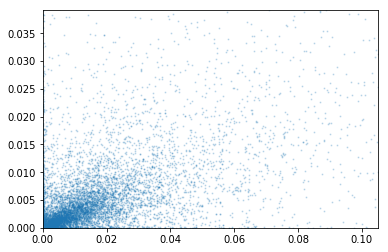

In [494]:
x_col = 'Endothelium'
y_col = 'Epithelium'
print(spearmanr(X,Y))
X = np.log2(norm_merged_Matrix_df[x_col]+1)
Y = np.log2(norm_merged_Matrix_df[y_col]+1)
plt.scatter(X,Y,s=1,alpha=0.2)
plt.xlim([0,np.percentile(X,95)])
plt.ylim([0,np.percentile(Y,95)])
plt.show()

In [497]:
import scipy
f = scipy.io.mmread(open(os.path.join(base_path,'GSM3272968_M0_BMDM_matrix.mtx'),'rb'))

In [508]:
genes = pd.read_csv(os.path.join(base_path,'GSM3272968_M0_BMDM_genes.tsv'),header=None,sep='\t')
barcodes = pd.read_csv(os.path.join(base_path,'GSM3272968_M0_BMDM_barcodes.tsv'),header=None,sep='\t')

In [511]:
print(len(genes))
print(len(barcodes))
print(len(barcodes)*len(genes))

27998
6979
195398042


In [502]:
type(f)

scipy.sparse.coo.coo_matrix

In [513]:
M = f.toarray()

In [514]:
M.shape

(27998, 6979)

In [520]:
genes

,0,1
0,ENSMUSG00000051951,Xkr4
1,ENSMUSG00000089699,Gm1992
2,ENSMUSG00000102343,Gm37381
3,ENSMUSG00000025900,Rp1
4,ENSMUSG00000109048,Rp1
5,ENSMUSG00000025902,Sox17
6,ENSMUSG00000104328,Gm37323
7,ENSMUSG00000033845,Mrpl15
8,ENSMUSG00000025903,Lypla1
9,ENSMUSG00000104217,Gm37988


In [523]:
counts = pd.DataFrame(data=M,columns=barcodes,index=genes[0])

In [524]:
counts.head()

,"(AAACCTGAGGACCACA-1,)","(AAACCTGAGTCGCCGT-1,)","(AAACCTGCAAGCGATG-1,)","(AAACCTGCACGCCAGT-1,)","(AAACCTGCAGACTCGC-1,)","(AAACCTGCAGGGTATG-1,)","(AAACCTGCATGTAAGA-1,)","(AAACCTGGTATAAACG-1,)","(AAACCTGGTCCGTTAA-1,)","(AAACCTGGTCTAGAGG-1,)",...,"(TTTGTCAGTGCTTCTC-1,)","(TTTGTCAGTGTCGCTG-1,)","(TTTGTCAGTTATTCTC-1,)","(TTTGTCAGTTCAGGCC-1,)","(TTTGTCATCCATGCTC-1,)","(TTTGTCATCCCTTGCA-1,)","(TTTGTCATCCTGCCAT-1,)","(TTTGTCATCTAACTCT-1,)","(TTTGTCATCTGAAAGA-1,)","(TTTGTCATCTGCAAGT-1,)"
0,,,,,,,,,,,,,,,,,,,,,
ENSMUSG00000051951,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000089699,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000102343,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000025900,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ENSMUSG00000109048,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [530]:
M0 = pd.DataFrame(data = np.average(counts,axis=1),index=genes[0],columns=['M0'])
M0.head()

,M0
0,
ENSMUSG00000051951,0.0
ENSMUSG00000089699,0.0
ENSMUSG00000102343,0.0
ENSMUSG00000025900,0.0
ENSMUSG00000109048,0.0


In [ ]:
'/home/zach/PythonRepos/PyScripts/MERCI/GSM3272968_M0_BMDM_matrix.mtx'

In [540]:
f = scipy.io.mmread(open(os.path.join(base_path,'GSM3272968_M0_BMDM_matrix.mtx'),'rb'))
genes = pd.read_csv(os.path.join(base_path,'GSM3272968_M0_BMDM_genes.tsv'),header=None,sep='\t')
barcodes = pd.read_csv(os.path.join(base_path,'GSM3272968_M0_BMDM_barcodes.tsv'),header=None,sep='\t')
M = f.toarray()
counts = pd.DataFrame(data=M,columns=barcodes,index=genes[0])
M0 = pd.DataFrame(data = np.sum(counts,axis=1),index=genes[0],columns=['M0'])
M0.head()


,M0
0,
ENSMUSG00000051951,0
ENSMUSG00000089699,0
ENSMUSG00000102343,0
ENSMUSG00000025900,0
ENSMUSG00000109048,0


In [541]:
f = scipy.io.mmread(open(os.path.join(base_path,'GSM3272969_M1_BDMD_matrix.mtx'),'rb'))
genes = pd.read_csv(os.path.join(base_path,'GSM3272969_M1_BMDM_genes.tsv'),header=None,sep='\t')
barcodes = pd.read_csv(os.path.join(base_path,'GSM3272969_M1_BMDM_barcodes.tsv'),header=None,sep='\t')
M = f.toarray()
counts = pd.DataFrame(data=M,columns=barcodes,index=genes[0])
M1 = pd.DataFrame(data = np.sum(counts,axis=1),index=genes[0],columns=['M1'])
M1.head()


,M1
0,
ENSMUSG00000051951,0
ENSMUSG00000089699,0
ENSMUSG00000102343,0
ENSMUSG00000025900,0
ENSMUSG00000109048,0


In [542]:
f = scipy.io.mmread(open(os.path.join(base_path,'GSM3272970_M2_BMDM_matrix.mtx'),'rb'))
genes = pd.read_csv(os.path.join(base_path,'GSM3272970_M2_BMDM_genes.tsv'),header=None,sep='\t')
barcodes = pd.read_csv(os.path.join(base_path,'GSM3272970_M2_BMDM_barcodes.tsv'),header=None,sep='\t')
M = f.toarray()
counts = pd.DataFrame(data=M,columns=barcodes,index=genes[0])
M2 = pd.DataFrame(data = np.sum(counts,axis=1),index=genes[0],columns=['M2'])
M2.head()

,M2
0,
ENSMUSG00000051951,0
ENSMUSG00000089699,0
ENSMUSG00000102343,0
ENSMUSG00000025900,0
ENSMUSG00000109048,0


In [543]:
Macrophage = pd.DataFrame(index=genes[0])
Macrophage['M0'] = M0
Macrophage['M1'] = M1
Macrophage['M2'] = M2
Macrophage.head()

,M0,M1,M2
0,,,
ENSMUSG00000051951,0,0,0
ENSMUSG00000089699,0,0,0
ENSMUSG00000102343,0,0,0
ENSMUSG00000025900,0,0,0
ENSMUSG00000109048,0,0,0


In [547]:
np.mean(Macrophage,axis=0)

M0    3265.145725
M1    2807.523573
M2    3102.986392
dtype: float64

In [548]:
Macrophage.to_csv(os.path.join(base_path,'Macrophage_scRNAseq_Combined.csv'))

In [550]:
Macrophage['Gene Symbol'] = genes[1]

In [553]:
genes.index = genes[0]

In [554]:
Macrophage['Gene Symbol'] = genes[1]
Macrophage

,M0,M1,M2,Gene Symbol
0,,,,
ENSMUSG00000051951,0,0,0,Xkr4
ENSMUSG00000089699,0,0,0,Gm1992
ENSMUSG00000102343,0,0,0,Gm37381
ENSMUSG00000025900,0,0,0,Rp1
ENSMUSG00000109048,0,0,0,Rp1
ENSMUSG00000025902,0,0,0,Sox17
ENSMUSG00000104328,0,0,0,Gm37323
ENSMUSG00000033845,4654,2621,4503,Mrpl15
ENSMUSG00000025903,2245,1819,2144,Lypla1


In [555]:
key = 'M0'
gkey = 'Gene Symbol'
column = column_generator(key,gkey,Macrophage,common_genes)

In [557]:
column[0]

,M0
0610007P14Rik,3867
0610009B22Rik,5024
0610009O20Rik,573
0610010K14Rik,3659
0610012G03Rik,42612
0610037L13Rik,2058
0610040J01Rik,52
1110001J03Rik,2316
1110004E09Rik,1369
1110004F10Rik,11452


In [558]:
spearmanr(norm_merged_Matrix_df['Macrophage'],column[0])

SpearmanrResult(correlation=0.65587052644808, pvalue=0.0)

SpearmanrResult(correlation=0.6558705264496243, pvalue=0.0)


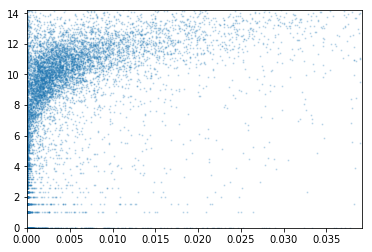

In [560]:
x_col = 'Epithelium'
y_col = 'Macrophage'
print(spearmanr(X,Y))
X = np.log2(norm_merged_Matrix_df[x_col]+1)
Y = np.log2(column[0]+1)
plt.scatter(X,Y,s=1,alpha=0.2)
plt.xlim([0,np.percentile(X,95)])
plt.ylim([0,np.percentile(Y,95)])
plt.show()

In [563]:
files = [i for i in os.listdir(base_path) if 'GSM25223' in i]

In [566]:
index = pd.read_csv(os.path.join(base_path,files[0]),sep='\t').index

In [567]:
Monocyte = pd.DataFrame(index=index)
mon_dict = {}
for f in files:
    mon_dict[f] = pd.read_csv(os.path.join(base_path,f),sep='\t')

In [571]:
Monocyte = pd.DataFrame(index=index)
for f in files:
    Monocyte = Monocyte.join(mon_dict[f])

In [572]:
Monocyte.head()

,W492305,W492306,W492307,W492308,W492309,W492310,W492311,W492312,W492313,W492314,...,W493063,W493064,W493065,W493066,W493067,W493068,W493069,W493070,W493071,W493072
0610005C13Rik,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0610007C21Rik,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2
0610007L01Rik,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
0610007P08Rik,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
0610007P14Rik,0,0,0,0,0,0,0,0,0,1,...,1,0,0,0,0,0,0,0,0,0


In [573]:
Monocytes = pd.DataFrame(data=np.sum(Monocyte,axis=1),index=index,columns=['Monocyte'])

In [575]:
Monocytes.to_csv(os.path.join(base_path,'Monocyte_scRNAseq_Combined.csv'))

In [1]:
import pysradb
from pysradb import SRAdb, download_sradb_file
from pysradb.filter_attrs import guess_tissue_type, guess_cell_type, guess_strain_type

In [2]:
download_sradb_file()

Extracting /home/zach/PythonRepos/PyScripts/MERCI/SRAmetadb.sqlite.gz ...


Extracting SRAmetadb.sqlite.gz: 100%|██████████| 56.8G/56.8G [22:22<00:00, 45.4MB/s]  


Done!
Metadata associated with /home/zach/PythonRepos/PyScripts/MERCI/SRAmetadb.sqlite:
                 name                value
0      schema version                  1.0
1  creation timestamp  2019-06-27 13:35:00


In [6]:
base_path = '/home/zach/PythonRepos/PyScripts/MERCI/'
db = SRAdb(os.path.join(base_path,'SRAmetadb.sqlite'))

In [7]:
GSE127267 = pd.read_csv(os.path.join(base_path,'GSE127267.csv'))
GSE127267.head()

,Accession,Title,Sample Type,Taxonomy,Channels,Platform,Series,Supplementary Types,Supplementary Links,SRA Accession,Contact,Release Date
0,GSM4057887,MF.226+II+480lo.PC#1_RNA-seq,SRA,Mus musculus,1,GPL19057,GSE109125;GSE127267,SRA Run Selector,https://www.ncbi.nlm.nih.gov/Traces/study/?acc...,SRX6794842,Liang Yang,"Sep 03, 2019"
1,GSM4057888,MF.226+II+480lo.PC#2_RNA-seq,SRA,Mus musculus,1,GPL19057,GSE109125;GSE127267,SRA Run Selector,https://www.ncbi.nlm.nih.gov/Traces/study/?acc...,SRX6794843,Liang Yang,"Sep 03, 2019"
2,GSM4057889,MF.microglia.CNS#1_RNA-seq,SRA,Mus musculus,1,GPL19057,GSE109125;GSE127267,SRA Run Selector,https://www.ncbi.nlm.nih.gov/Traces/study/?acc...,SRX6794844,Liang Yang,"Sep 03, 2019"
3,GSM4057890,MF.microglia.CNS#2_RNA-seq,SRA,Mus musculus,1,GPL19057,GSE109125;GSE127267,SRA Run Selector,https://www.ncbi.nlm.nih.gov/Traces/study/?acc...,SRX6794845,Liang Yang,"Sep 03, 2019"
4,GSM4057891,MF.RP.Sp#1_RNA-seq,SRA,Mus musculus,1,GPL19057,GSE109125;GSE127267,SRA Run Selector,https://www.ncbi.nlm.nih.gov/Traces/study/?acc...,SRX6794846,Liang Yang,"Sep 03, 2019"


In [ ]:
db.sra_metadata(GSE127267['SRA Accession'][0])

In [ ]:
GSE127267['Series']

In [8]:
GSEs = ['GSE109125','GSE122108','GSE122597','GSE124829']
temp_df = db.gse_to_srp(GSEs)
temp_df

,study_alias,study_accession
0,GSE100738,SRP110978
1,GSE109125,SRP128986
2,GSE122108,SRP167701
3,GSE122597,SRP168934
4,GSE124829,SRP176663


In [9]:
dfs = []
for srp in temp_df['study_accession']:
    dfs.append(db.sra_metadata(srp))

In [10]:
df = pd.concat(dfs,ignore_index=True).drop_duplicates()
df

,study_accession,experiment_accession,sample_accession,run_accession
0,SRP110978,SRX2978848,SRS2332741,SRR5799381
1,SRP110978,SRX2978849,SRS2332742,SRR5799382
2,SRP110978,SRX2978850,SRS2332740,SRR5799383
3,SRP110978,SRX2978851,SRS2332743,SRR5799384
4,SRP110978,SRX2978852,SRS2332744,SRR5799385
5,SRP110978,SRX2978853,SRS2332745,SRR5799386
6,SRP110978,SRX2978854,SRS2332746,SRR5799387
7,SRP110978,SRX2978855,SRS2332747,SRR5799388
8,SRP110978,SRX2978856,SRS2332748,SRR5799389
9,SRP110978,SRX2978857,SRS2332749,SRR5799390


In [11]:
len(df['study_accession'].unique())

5

In [13]:
bad = []
good = []
for srx in df['study_accession'].unique():
    try:
        db.download(df=df[df['study_accession']==srx], out_dir='/bigstore/binfo/mouse/Immune/All/')
        good.append(srx)
    except:
        print(srx)
        bad.append(srx)

Count not find aspera at: /home/zach/.aspera
Install aspera-client following instructionsat https://github.com/saketkc/pysradb/README.rst for faster downloads.
You can supress this message by using `--use-wget` flag
Continuing with wget ...



The following files will be downloaded: 

study_accession experiment_accession sample_accession run_accession download_url                                                                                          
SRP110978       SRX2978848           SRS2332741       SRR5799381    ftp://ftp-trace.ncbi.nlm.nih.gov/sra/sra-instant/reads/ByRun/sra/SRR/SRR579/SRR5799381/SRR5799381.sra
SRP110978       SRX2978849           SRS2332742       SRR5799382    ftp://ftp-trace.ncbi.nlm.nih.gov/sra/sra-instant/reads/ByRun/sra/SRR/SRR579/SRR5799382/SRR5799382.sra
SRP110978       SRX2978850           SRS2332740       SRR5799383    ftp://ftp-trace.ncbi.nlm.nih.gov/sra/sra-instant/reads/ByRun/sra/SRR/SRR579/SRR5799383/SRR5799383.sra
SRP110978       SRX2978851           SRS2332743       SRR5799384    ftp://ftp-trace.ncbi.nlm.nih.gov/sra/sra-instant/reads/ByRun/sra/SRR/SRR579/SRR5799384/SRR5799384.sra
SRP110978       SRX2978852           SRS2332744       SRR5799385    ftp://ftp-trace.ncbi.nlm.nih.gov/sra/sr

Start download? [Y/n]: Y


SRP110978/SRX2978851/SRR5799384:   2%|▏         | 3/181 [00:41<41:21, 13.94s/it]
Count not find aspera at: /home/zach/.aspera
Install aspera-client following instructionsat https://github.com/saketkc/pysradb/README.rst for faster downloads.
You can supress this message by using `--use-wget` flag
Continuing with wget ...



SRP110978
The following files will be downloaded: 

study_accession experiment_accession sample_accession run_accession download_url                                                                                          
SRP128986       SRX3556855           SRS2830164       SRR6466906    ftp://ftp-trace.ncbi.nlm.nih.gov/sra/sra-instant/reads/ByRun/sra/SRR/SRR646/SRR6466906/SRR6466906.sra
SRP128986       SRX3556856           SRS2830165       SRR6466907    ftp://ftp-trace.ncbi.nlm.nih.gov/sra/sra-instant/reads/ByRun/sra/SRR/SRR646/SRR6466907/SRR6466907.sra
SRP128986       SRX3556857           SRS2830166       SRR6466908    ftp://ftp-trace.ncbi.nlm.nih.gov/sra/sra-instant/reads/ByRun/sra/SRR/SRR646/SRR6466908/SRR6466908.sra
SRP128986       SRX3556858           SRS2830167       SRR6466909    ftp://ftp-trace.ncbi.nlm.nih.gov/sra/sra-instant/reads/ByRun/sra/SRR/SRR646/SRR6466909/SRR6466909.sra
SRP128986       SRX3556859           SRS2830168       SRR6466910    ftp://ftp-trace.ncbi.nlm.nih.

Start download? [Y/n]: Y


SRP128986/SRX3556856/SRR6466907:   1%|          | 1/157 [00:22<59:08, 22.75s/it]
Count not find aspera at: /home/zach/.aspera
Install aspera-client following instructionsat https://github.com/saketkc/pysradb/README.rst for faster downloads.
You can supress this message by using `--use-wget` flag
Continuing with wget ...



SRP128986
The following files will be downloaded: 

study_accession experiment_accession sample_accession run_accession download_url                                                                                          
SRP167701       SRX4967530           SRS4006982       SRR8147034    ftp://ftp-trace.ncbi.nlm.nih.gov/sra/sra-instant/reads/ByRun/sra/SRR/SRR814/SRR8147034/SRR8147034.sra
SRP167701       SRX4967531           SRS4006983       SRR8147035    ftp://ftp-trace.ncbi.nlm.nih.gov/sra/sra-instant/reads/ByRun/sra/SRR/SRR814/SRR8147035/SRR8147035.sra
SRP167701       SRX4967532           SRS4006985       SRR8147036    ftp://ftp-trace.ncbi.nlm.nih.gov/sra/sra-instant/reads/ByRun/sra/SRR/SRR814/SRR8147036/SRR8147036.sra
SRP167701       SRX4967533           SRS4006984       SRR8147037    ftp://ftp-trace.ncbi.nlm.nih.gov/sra/sra-instant/reads/ByRun/sra/SRR/SRR814/SRR8147037/SRR8147037.sra
SRP167701       SRX4967534           SRS4006986       SRR8147038    ftp://ftp-trace.ncbi.nlm.nih.

Start download? [Y/n]: Y


SRP167701/SRX4967530/SRR8147034:   0%|          | 0/412 [00:00<?, ?it/s]
Count not find aspera at: /home/zach/.aspera
Install aspera-client following instructionsat https://github.com/saketkc/pysradb/README.rst for faster downloads.
You can supress this message by using `--use-wget` flag
Continuing with wget ...



SRP167701
The following files will be downloaded: 

study_accession experiment_accession sample_accession run_accession download_url                                                                                          
SRP168934       SRX5014126           SRS4047993       SRR8194734    ftp://ftp-trace.ncbi.nlm.nih.gov/sra/sra-instant/reads/ByRun/sra/SRR/SRR819/SRR8194734/SRR8194734.sra
SRP168934       SRX5014127           SRS4047994       SRR8194735    ftp://ftp-trace.ncbi.nlm.nih.gov/sra/sra-instant/reads/ByRun/sra/SRR/SRR819/SRR8194735/SRR8194735.sra
SRP168934       SRX5014128           SRS4047995       SRR8194736    ftp://ftp-trace.ncbi.nlm.nih.gov/sra/sra-instant/reads/ByRun/sra/SRR/SRR819/SRR8194736/SRR8194736.sra
SRP168934       SRX5014129           SRS4047996       SRR8194737    ftp://ftp-trace.ncbi.nlm.nih.gov/sra/sra-instant/reads/ByRun/sra/SRR/SRR819/SRR8194737/SRR8194737.sra
SRP168934       SRX5014130           SRS4047997       SRR8194738    ftp://ftp-trace.ncbi.nlm.nih.

Start download? [Y/n]: Y


SRP168934/SRX5014126/SRR8194734:   0%|          | 0/83 [00:00<?, ?it/s]
Count not find aspera at: /home/zach/.aspera
Install aspera-client following instructionsat https://github.com/saketkc/pysradb/README.rst for faster downloads.
You can supress this message by using `--use-wget` flag
Continuing with wget ...



SRP168934
The following files will be downloaded: 

study_accession experiment_accession sample_accession run_accession download_url                                                                                          
SRP176663       SRX5229152           SRS4232926       SRR8420089    ftp://ftp-trace.ncbi.nlm.nih.gov/sra/sra-instant/reads/ByRun/sra/SRR/SRR842/SRR8420089/SRR8420089.sra
SRP176663       SRX5229153           SRS4232927       SRR8420090    ftp://ftp-trace.ncbi.nlm.nih.gov/sra/sra-instant/reads/ByRun/sra/SRR/SRR842/SRR8420090/SRR8420090.sra
SRP176663       SRX5229154           SRS4232928       SRR8420091    ftp://ftp-trace.ncbi.nlm.nih.gov/sra/sra-instant/reads/ByRun/sra/SRR/SRR842/SRR8420091/SRR8420091.sra
SRP176663       SRX5229155           SRS4232929       SRR8420092    ftp://ftp-trace.ncbi.nlm.nih.gov/sra/sra-instant/reads/ByRun/sra/SRR/SRR842/SRR8420092/SRR8420092.sra
SRP176663       SRX5229156           SRS4232930       SRR8420093    ftp://ftp-trace.ncbi.nlm.nih.

Start download? [Y/n]: Y


SRP176663/SRX5229152/SRR8420089:   0%|          | 0/190 [00:00<?, ?it/s]

SRP176663


In [14]:
for srr in df['run_accession'].unique():
    !echo {srr}

SRR5799381
SRR5799382
SRR5799383
SRR5799384
SRR5799385
SRR5799386
SRR5799387
SRR5799388
SRR5799389
SRR5799390
SRR5799391
SRR5799392
SRR5799393
SRR5799394
SRR5799395
SRR5799396
SRR5799397
SRR5799398
SRR5799399
SRR5799400
SRR5799401
SRR5799402
SRR5799403
SRR5799404
SRR5799405
SRR5799406
SRR5799407
SRR5799408
SRR5799409
SRR5799410
SRR5799411
SRR5799412
SRR5799413
SRR5799414
SRR5799415
SRR5799416
SRR5799417
SRR5799418
SRR5799419
SRR5799420
SRR5799421
SRR5799422
SRR5799423
SRR5799424
SRR5799425
SRR5799426
SRR5799427
SRR5799428
SRR5799429
SRR5799430
SRR5799431
SRR5799432
SRR5799433
SRR5799434
SRR5799435
SRR5799436
SRR5799437
SRR5799438
SRR5799439
SRR5799440
SRR5799441
SRR5799442
SRR5799443
SRR5799444
SRR5799445
SRR5799446
SRR5799447
SRR5799448
SRR5799449
SRR5799450
SRR5799451
SRR5799452
SRR5799453
SRR5799454
SRR5799455
SRR5799456
SRR5799457
SRR5799458
SRR5799459
SRR5799460
SRR5799461
SRR5799462
SRR5799463
SRR5799464
SRR5799465
SRR5799466
SRR5799467
SRR5799468
SRR5799469
SRR5799470
SRR5799471

SRR8147443
SRR8147444
SRR8147445
SRR8147446
SRR8147447
SRR8194734
SRR8194735
SRR8194736
SRR8194737
SRR8194738
SRR8194739
SRR8194740
SRR8194741
SRR8194742
SRR8194743
SRR8194744
SRR8194745
SRR8194746
SRR8194747
SRR8194748
SRR8194749
SRR8194750
SRR8194751
SRR8194752
SRR8194753
SRR8194754
SRR8194755
SRR8194756
SRR8194757
SRR8194758
SRR8194759
SRR8194760
SRR8194761
SRR8194762
SRR8194763
SRR8194764
SRR8194765
SRR8194766
SRR8194767
SRR8194768
SRR8194769
SRR8194770
SRR8194771
SRR8194772
SRR8194773
SRR8194774
SRR8194775
SRR8194776
SRR8194777
SRR8194778
SRR8194779
SRR8194780
SRR8194781
SRR8194782
SRR8194783
SRR8194784
SRR8194785
SRR8194786
SRR8194787
SRR8194788
SRR8194789
SRR8194790
SRR8194791
SRR8194792
SRR8194793
SRR8194794
SRR8194795
SRR8194796
SRR8194797
SRR8194798
SRR8194799
SRR8194800
SRR8194718
SRR8194719
SRR8194720
SRR8194721
SRR8194722
SRR8194723
SRR8194724
SRR8194725
SRR8194726
SRR8194727
SRR8194728
SRR8194729
SRR8194730
SRR8194731
SRR8194732
SRR8194733
SRR8420089
SRR8420090
SRR8420091

In [15]:
! fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ {srr} 

Read 5295651 spots for SRR8420278
Written 5295651 spots for SRR8420278


In [ ]:
for i,srr in enumerate(SRR_list[0]):
    print(i,srr)
    !fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ {srr} 

0 SRR5799381
Read 9165759 spots for SRR5799381
Written 9165759 spots for SRR5799381
1 SRR5799382
Read 10157529 spots for SRR5799382
Written 10157529 spots for SRR5799382
2 SRR5799383
Read 9513299 spots for SRR5799383
Written 9513299 spots for SRR5799383
3 SRR5799384
Read 10096189 spots for SRR5799384
Written 10096189 spots for SRR5799384
4 SRR5799385
Read 9966713 spots for SRR5799385
Written 9966713 spots for SRR5799385
5 SRR5799386
Read 9867135 spots for SRR5799386
Written 9867135 spots for SRR5799386
6 SRR5799387
Read 10717419 spots for SRR5799387
Written 10717419 spots for SRR5799387
7 SRR5799388
Read 9344485 spots for SRR5799388
Written 9344485 spots for SRR5799388
8 SRR5799389
Read 10628114 spots for SRR5799389
Written 10628114 spots for SRR5799389
9 SRR5799390
Read 11261924 spots for SRR5799390
Written 11261924 spots for SRR5799390
10 SRR5799391
Read 12321463 spots for SRR5799391
Written 12321463 spots for SRR5799391
11 SRR5799392
Read 8857876 spots for SRR5799392
Written 8857876

In [ ]:
from fish_helpers import *
base_path = '/home/zach/PythonRepos/PyScripts/MERCI/'
out_path = '/bigstore/binfo/mouse/Immune/All/'
SRR_list = pd.read_csv(os.path.join(base_path,'SRR_List.csv'),header=None)
for srr in SRR_list[0]:
    if not os.path.exists(str(os.path.join(out_path,srr)+'.fastq')):
        print(srr)
        !fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ {srr} 

SRR5799395
Read 12364592 spots for SRR5799395
Written 12364592 spots for SRR5799395
SRR5799399
Read 11154723 spots for SRR5799399
Written 11154723 spots for SRR5799399
SRR5799402
Read 13603191 spots for SRR5799402
Written 13603191 spots for SRR5799402
SRR5799406
Read 12110999 spots for SRR5799406
Written 12110999 spots for SRR5799406
SRR5799409
Read 13817260 spots for SRR5799409
Written 13817260 spots for SRR5799409
SRR5799413
Read 10182659 spots for SRR5799413
Written 10182659 spots for SRR5799413
SRR5799417
Read 11599662 spots for SRR5799417
Written 11599662 spots for SRR5799417
SRR5799423
2019-11-12T21:21:40 fastq-dump.2.8.2 sys: libs/kns/unix/syssock.c:606:KSocketTimedRead: timeout exhausted while reading file within network system module - mbedtls_ssl_read returned -76 ( NET - Reading information from the socket failed )
Read 10500490 spots for SRR5799423
Written 10500490 spots for SRR5799423
SRR5799426
Read 13280296 spots for SRR5799426
Written 13280296 spots for SRR5799426
SRR57

In [5]:
str(os.path.join(base_path,srr)+'.fastq')

'/home/zach/PythonRepos/PyScripts/MERCI/SRR8420278.fastq'

In [15]:
from functools import partial
def srr_wrapper(srr):
    print(srr)
    !fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ {srr} 
Input = [i for i in SRR_list[0]]
ncpu=5
pfunc = partial(srr_wrapper)
with multiprocessing.Pool(ncpu) as ppool:
    sys.stdout.flush()
    ppool.imap(pfunc, Input)
    sys.stdout.flush()

In [12]:
Input = [i for i in SRR_list[0]]

In [14]:
Input

['SRR5799381',
 'SRR5799382',
 'SRR5799383',
 'SRR5799384',
 'SRR5799385',
 'SRR5799386',
 'SRR5799387',
 'SRR5799388',
 'SRR5799389',
 'SRR5799390',
 'SRR5799391',
 'SRR5799392',
 'SRR5799393',
 'SRR5799394',
 'SRR5799395',
 'SRR5799396',
 'SRR5799397',
 'SRR5799398',
 'SRR5799399',
 'SRR5799400',
 'SRR5799401',
 'SRR5799402',
 'SRR5799403',
 'SRR5799404',
 'SRR5799405',
 'SRR5799406',
 'SRR5799407',
 'SRR5799408',
 'SRR5799409',
 'SRR5799410',
 'SRR5799411',
 'SRR5799412',
 'SRR5799413',
 'SRR5799414',
 'SRR5799415',
 'SRR5799416',
 'SRR5799417',
 'SRR5799418',
 'SRR5799419',
 'SRR5799420',
 'SRR5799421',
 'SRR5799422',
 'SRR5799423',
 'SRR5799424',
 'SRR5799425',
 'SRR5799426',
 'SRR5799427',
 'SRR5799428',
 'SRR5799429',
 'SRR5799430',
 'SRR5799431',
 'SRR5799432',
 'SRR5799433',
 'SRR5799434',
 'SRR5799435',
 'SRR5799436',
 'SRR5799437',
 'SRR5799438',
 'SRR5799439',
 'SRR5799440',
 'SRR5799441',
 'SRR5799442',
 'SRR5799443',
 'SRR5799444',
 'SRR5799445',
 'SRR5799446',
 'SRR57994

In [24]:
from fish_helpers import *
base_path = '/bigstore/GeneralStorage/Zach/MERCI/'
out_path = '/bigstore/binfo/mouse/Immune/All/'
SRR_list = pd.read_csv(os.path.join(base_path,'SRR_List.csv'),header=None)
for srr in SRR_list[0]:
    if not os.path.exists(str(os.path.join(out_path,srr)+'.fastq')):
        print('fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/',srr)

In [28]:
import os
pairs = []
for file in os.listdir(out_path):
    location = os.path.join(directory, file)
    size = os.path.getsize(location)
    pairs.append((size, file))
pairs.sort(key=lambda s: s[0])
for size,srr in pairs:
    print('fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/',srr.split('.')[0])

fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8420270
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8420157
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8420273
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8147147
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8147079
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8194765
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8420121
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8420161
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8147372
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8420133
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8420190
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8420242
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8147282
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8147271
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8147269
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8420155
fastq-du

fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR5799554
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR5799481
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8147156
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR5799499
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8147341
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8147177
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR5799495
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8147178
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR5799397
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8420193
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR5799487
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8420191
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR5799461
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR8194795
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR5799506
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR5799490
fastq-du

In [31]:
SRRS = ['SRR7264022','SRR7264023','SRR7264024','SRR7264025','SRR7264026','SRR7264027','SRR7264028','SRR7264029','SRR7264030','SRR7264031','SRR7264032','SRR7264033','SRR7264034','SRR7264035','SRR7264036','SRR7264037','SRR7264038','SRR7264039','SRR7264040','SRR7264041','SRR7264042','SRR7264043','SRR7264044','SRR7264045','SRR7264046','SRR7264047','SRR7264048','SRR7264049','SRR7264050','SRR7264051','SRR7264052','SRR7264053','SRR1640073','SRR1640074','SRR1640075','SRR1640076','SRR1640077','SRR1640078','SRR1640082','SRR1640083','SRR1640084','SRR1640085','SRR1640086','SRR1640087']
for i,srr in enumerate(SRRS):
    print('fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/',srr.split('.')[0])
    if i%10==0:
        print('rm -rf /home/zach/ncbi')
print('rm -rf /home/zach/ncbi')

fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR7264022
rm -rf /home/zach/ncbi
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR7264023
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR7264024
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR7264025
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR7264026
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR7264027
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR7264028
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR7264029
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR7264030
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR7264031
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR7264032
rm -rf /home/zach/ncbi
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR7264033
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR7264034
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR7264035
fastq-dump -I -O /bigstore/binfo/mouse/Immune/All/ SRR7264036
fastq-dump -I -O /bigsto